In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import astropy.io.fits as fitsio
from astropy.coordinates import SkyCoord
import astropy.units as u

In [2]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
from importlib import reload
import sys
sys.path.append('/Users/nora/projects/stream_search/code')
import plot_density
reload(plot_density)
import streamlib
reload(streamlib)
import skymap
reload(skymap)
print(skymap.__version__)
import galstreams
reload(galstreams)

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/galpy/util/_load_extension_libs.py:4: DeprecationWarning: The distutils.sysconfig module is deprecated, use sysconfig instead
  import distutils.sysconfig as sysconfig

/Users/nora/projects/stream_search/code/plot_density.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter

0.2.0


<module 'galstreams' from '/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/galstreams/__init__.py'>

In [5]:
mw_streams = galstreams.MWStreams(verbose=False)

Initializing galstreams library from master_log... 


In [6]:
plot_density.plot_pretty(figsize=(12,12))

# Filtered Data

In [16]:
# # filename = '/Users/nora/projects/stream_search/data/DECaLS_iso_hpxcube_z0.0001_a13.5_gmax23.fits.gz'
# # hpxcube, fracdet, modulus = plot_density.load_hpxcube(filename)

# # filename = '/Users/nora/projects/stream_search/data/DECaLS_iso_hpxcube_z0.0004_a13.5_gmax23.fits.gz'
# # hpxcube0004, fracdet, modulus = plot_density.load_hpxcube(filename)

# # filename = '/Users/nora/projects/stream_search/data/DECaLS_iso_hpxcube_z0.0010_a13.5_gmax23.fits.gz'
# # hpxcube001, fracdet, modulus = plot_density.load_hpxcube(filename)

# # filename = '/Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v4.fits.gz'
# # hpxcube4, fracdet, modulus = plot_density.load_hpxcube(filename)

# # # filename = '/Users/nora/projects/stream_search/data/iso_hpxcube_ps1_v2.fits.gz'
# # # hpxcube_ps1, fracdet_ps1, modulus_ps1 = plot_density.load_hpxcube(filename)

# import load_data
# reload(load_data)
# filename = '/Users/nora/projects/stream_search/data/DECaLS_DR10_iso_hpxcube_z0.0001_a12.0_gmax23.0_gmin16.fits.gz'
# # hpxcube, fracdet, modulus = load_data.load_data(survey='DECaLS_DR10', z=0.0001, age=12.0, gmax=23.0)  
# hpxcube, fracdet, modulus = load_data.load_data(filename)

In [15]:
hpxcube, fracdet, modulus = load_data.load_hpxcube(filename)

Reading /Users/nora/projects/stream_search/data/DECaLS_DR10_iso_hpxcube_z0.0001_a12.0_gmax23.0_gmin16.fits.gz...
Error reading modulus...


In [17]:
print(hpxcube.max())


1434.0


In [18]:
mw_streams.keys()

dict_keys(['20.0-1-M18', '300S-F18', 'AAU-AliqaUma-L21', 'AAU-ATLAS-L21', 'Acheron-G09', 'ACS-R21', 'Alpheus-G13', 'Aquarius-W11', 'C-19-I21', 'C-4-I21', 'C-5-I21', 'C-7-I21', 'C-8-I21', 'C-9-I21', 'Cetus-New-Y21', 'Cetus-Palca-T21', 'Cetus-Y13', 'Cocytos-G09', 'Corvus-M18', 'Elqui-S19', 'Eridanus-M17', 'Gaia-1-I21', 'Gaia-10-I21', 'Gaia-11-I21', 'Gaia-12-I21', 'Gaia-2-I21', 'Gaia-3-M18', 'Gaia-4-M18', 'Gaia-5-M18', 'Gaia-6-I21', 'Gaia-7-I21', 'Gaia-8-I21', 'Gaia-9-I21', 'GD-1-I21', 'Gunnthra-I21', 'Hermus-G14', 'Hrid-I21', 'Hyllus-G14', 'Indus-S19', 'Jet-F22', 'Jhelum-a-B19', 'Jhelum-b-B19', 'Kshir-I21', 'Kwando-G17', 'Leiptr-I21', 'Lethe-G09', 'LMS1-Y20', 'M2-I21', 'M30-S20', 'M5-G19', 'M68-P19', 'M92-I21', 'Molonglo-G17', 'Monoceros-R21', 'Murrumbidgee-G17', 'NGC1261-I21', 'NGC1851-I21', 'NGC2298-I21', 'NGC288-I21', 'NGC3201-P21', 'NGC5466-G06', 'NGC6362-S20', 'NGC6397-I21', 'OmegaCen-I21', 'Ophiuchus-C20', 'Orinoco-G17', 'Orphan-K19', 'Pal13-S20', 'Pal15-M17', 'Pal5-PW19', 'Palca-S

In [22]:
if fracdet is None:
    fracdet = np.zeros_like(hpxcube[:,0])
    fracdet[np.where(np.sum(hpxcube, axis=1) > 0)] = 1

/Users/nora/projects/stream_search/code/plot_density.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/skymap/core.py:556: AstropyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smooth = hp.smoothing(hpxmap,sigma=np.radians(sigma),verbose=False)



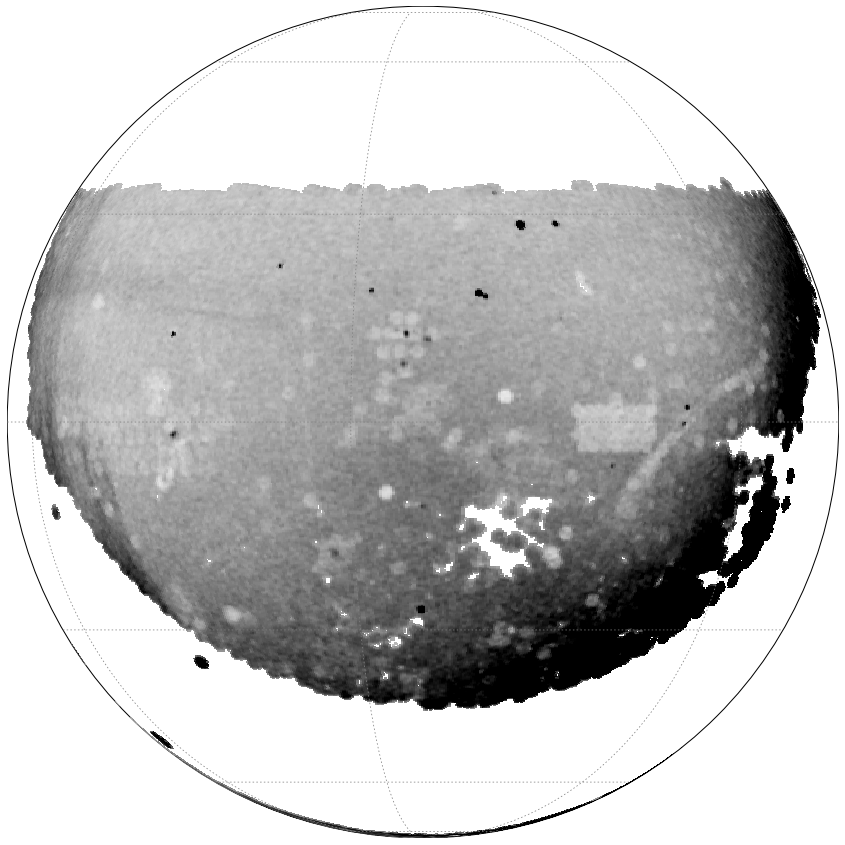

In [24]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = 190, 0
center = (lon, lat)
vmin, vmax = 0, 20
sigma = 0.2
proj = 'ortho'
stream = 'ATLAS'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)

smap = plot_density.plot_density(data, 0, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)


In [26]:
# reload(plot_density)
# smap = plot_density.plot_density(data, bkg, center=(120,30), vmax=18)
# # smap = plot_density.plot_density(data_north, bkg, center=(120,30), vmax=20, smap=smap)
# # smap = plot_density.plot_density(data_ps1, bkg, center=(120,30), vmax=20, smap=smap)

# # smap = plot_density.plot_density(data_ps1, bkg, center=(120,30), vmax=20)
# # smap = plot_density.plot_density(data, bkg, center=(120,30), vmax=20)
# # smap = plot_density.plot_density(data_north, bkg, center=(120,30), vmax=20, smap=smap)

# # plot_density.plot_stream_list(smap, ['GD-1'])
# plot_density.plot_streams(smap, mu, dmu=100)
# # plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

/Users/nora/projects/stream_search/code/plot_density.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter

/Users/nora/projects/stream_search/code/streamlib.py:326: AstropyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  data = np.ma.array(hp.smoothing(data, sigma=np.radians(sigma), verbose=False),

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/numpy/polynomial/polynomial.py:1104: RuntimeWarning: invalid value encountered in multiply
  v[0] = x*0 + 1

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/numpy/polynomial/polynomial.py:1104: RuntimeWarning: invalid value encountered in multiply
  v[0] = x*0 + 1

/Users/nora/projects/stream_search/code/polyfit2d.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, 

LinAlgError: SVD did not converge in Linear Least Squares

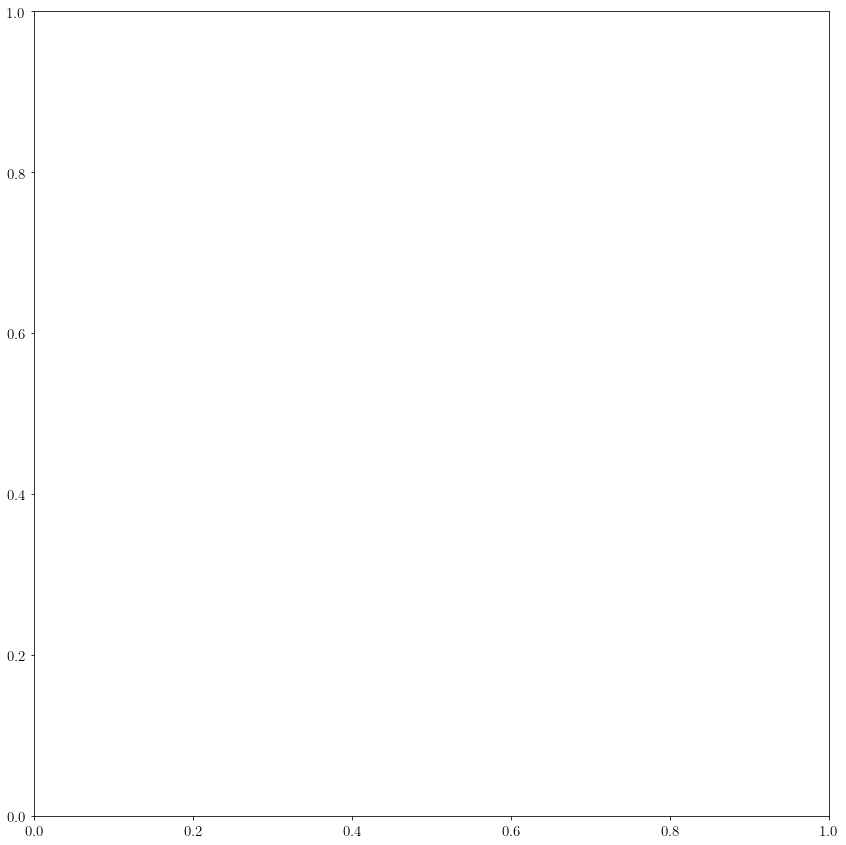

In [27]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = 190, 0
center = (lon, lat)
vmin, vmax = 0, 12
# vmin, vmax = 0, 12
# vmin, vmax = None, None
sigma = 0.2
proj = 'ortho'
stream = 'ATLAS'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)
# bkg = 0
bkg2 = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)

smap = plot_density.plot_density(data, 0, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
smap = plot_density.plot_density(data, bkg2, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

# smap = plot_density.plot_density(bkg, 0, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

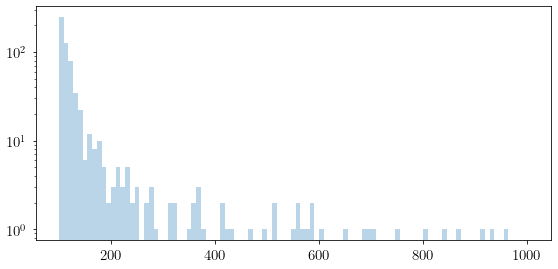

In [28]:
bins = np.linspace(100, 1000, 100)
plt.figure(figsize=(8,4))
plt.hist(data, bins=bins, alpha=0.3)
# plt.hist(data-bkg, bins=bins, alpha=0.3)
plt.yscale('log')

/Users/nora/projects/stream_search/code/plot_density.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/skymap/core.py:556: AstropyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smooth = hp.smoothing(hpxmap,sigma=np.radians(sigma),verbose=False)



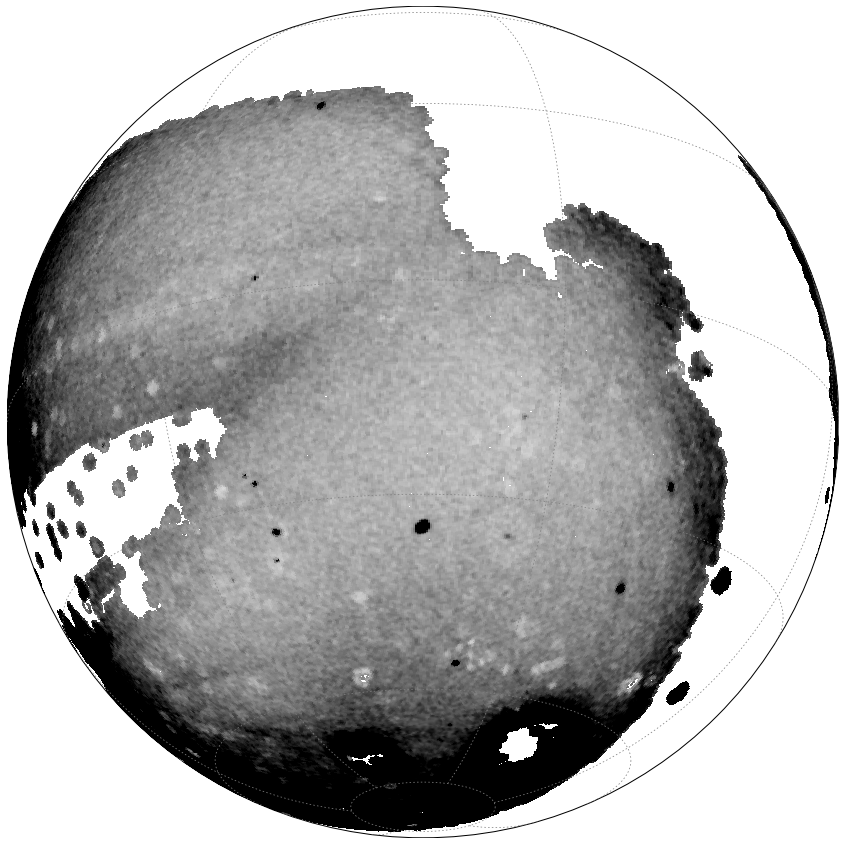

In [30]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = 40, -20
center = (lon, lat)
vmin, vmax = 0, 10
# vmin, vmax = 0, 12
# vmin, vmax = None, None
sigma = 0.2
proj = 'ortho'
stream = 'ATLAS'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# data4 = plot_density.prepare_hpxmap(mu, hpxcube4, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)
bkg = 0

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
# smap = plot_density.plot_density(data4, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

# smap = plot_density.plot_density(bkg, 0, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

/Users/nora/projects/stream_search/code/plot_density.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/skymap/core.py:556: AstropyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smooth = hp.smoothing(hpxmap,sigma=np.radians(sigma),verbose=False)

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/skymap/core.py:556: AstropyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smooth = hp.smoothing(hpxmap,sigma=np.radians(sigma),verbose=False)

Initializing galstreams library from master_log... 


AttributeError: 'Track6D' object has no attribute 'Rhel'

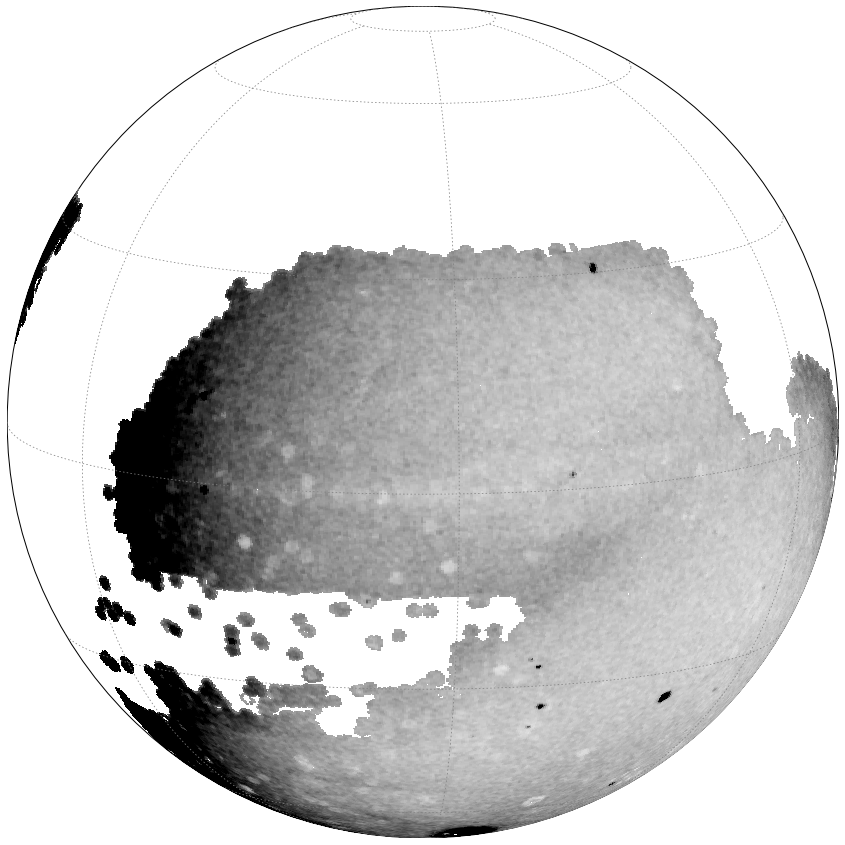

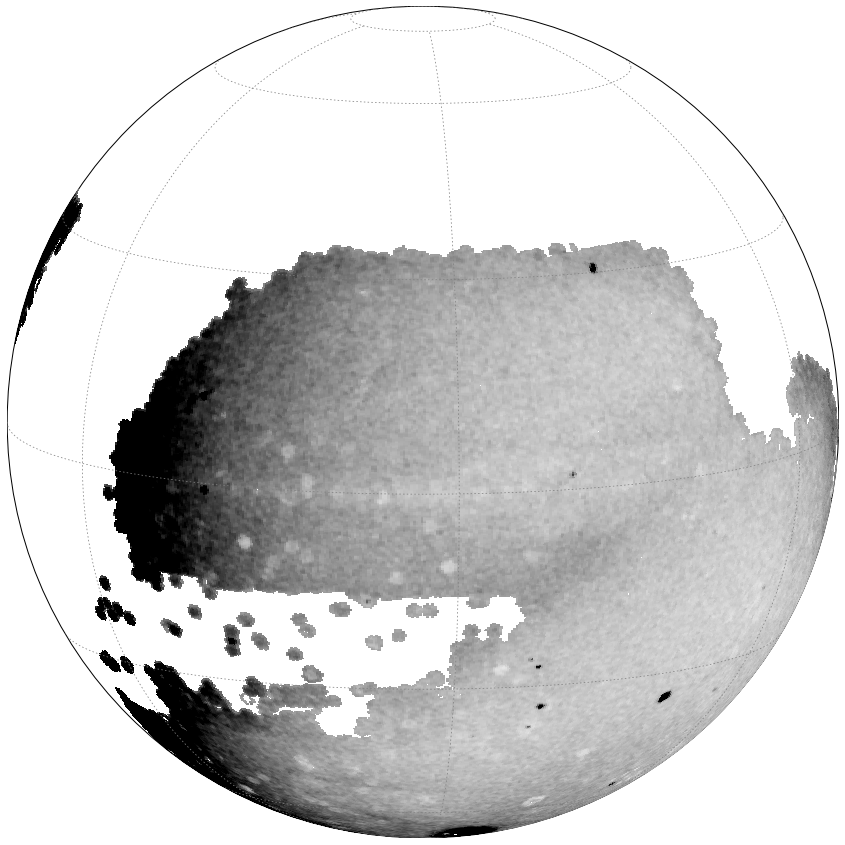

In [31]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = -5, 10
center = (lon, lat)
vmin, vmax = 0, 15
# vmin, vmax = 0, 12
# vmin, vmax = None, None
sigma = 0.2
proj = 'ortho'
stream = 'ATLAS'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)
bkg = 0

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
plot_density.plot_streams(smap, mu, dmu=100)

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(bkg, 0, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

/Users/nora/projects/stream_search/code/plot_density.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/skymap/core.py:556: AstropyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smooth = hp.smoothing(hpxmap,sigma=np.radians(sigma),verbose=False)

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/skymap/core.py:556: AstropyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smooth = hp.smoothing(hpxmap,sigma=np.radians(sigma),verbose=False)

Initializing galstreams library from master_log... 


AttributeError: 'Track6D' object has no attribute 'Rhel'

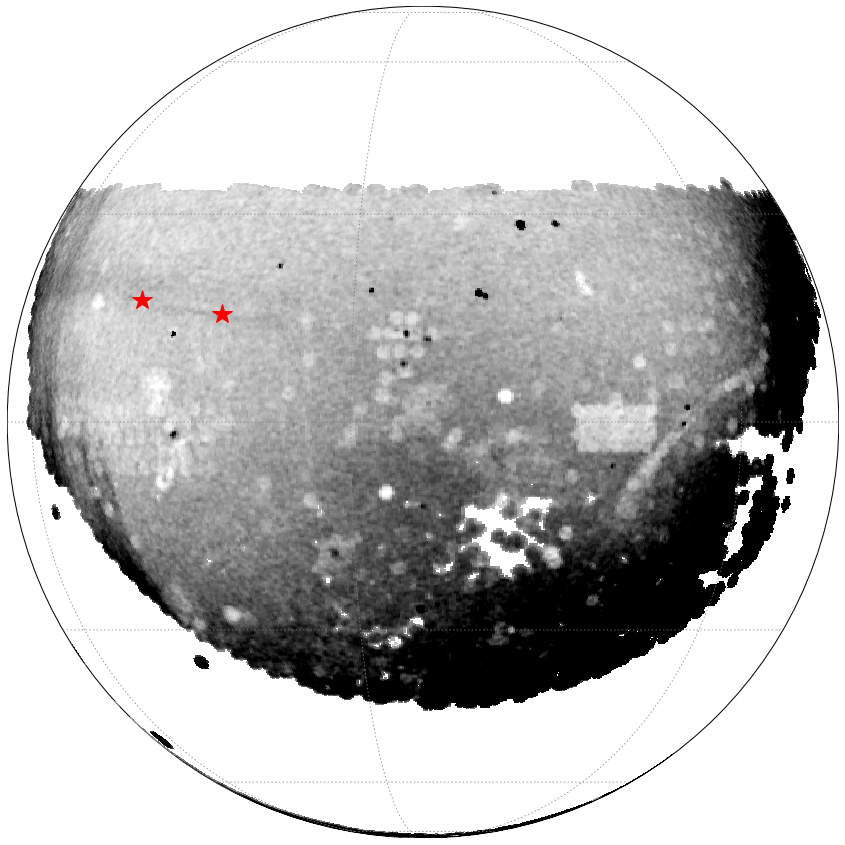

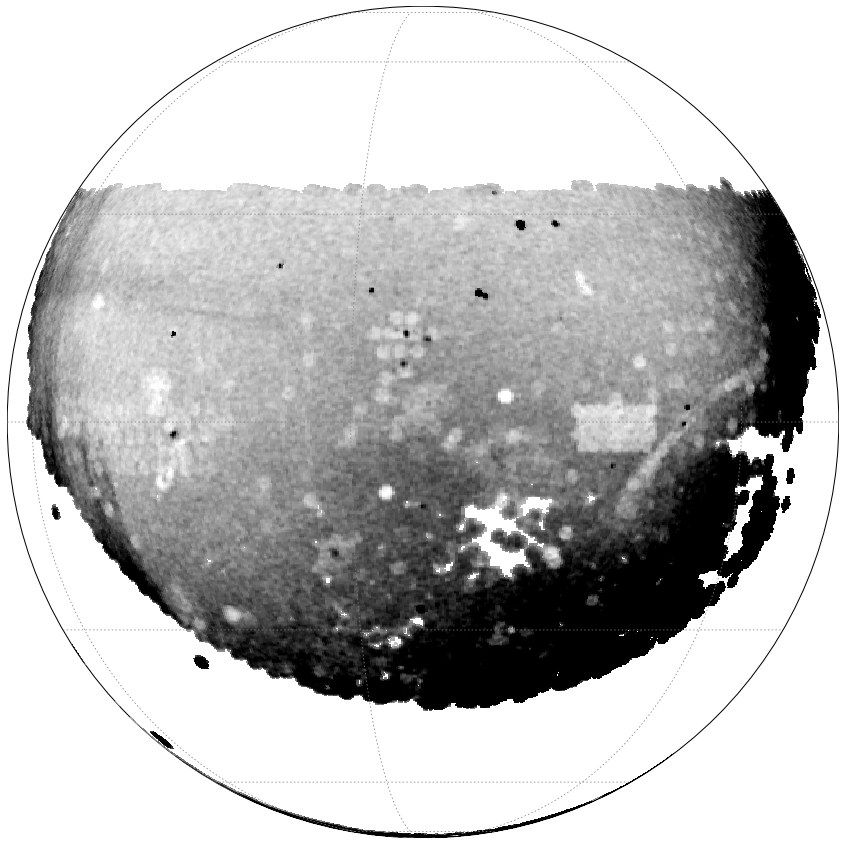

In [33]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = 190, 0
center = (lon, lat)
vmin, vmax = -40, 15
sigma = 0.2
proj = 'ortho'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
bkg = 0# plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
# smap = plot_density.plot_density(data_north, 0, center=(lon,lat), vmax=vmax, coords=coords, proj='ortho', xsize=3000, smooth=sigma, smap=smap)

# smap = plot_density.plot_density(bkg, 0, center=center, vmax=vmax, coords='cel', proj=proj, xsize=3000, smooth=sigma)

x1, y1 = smap(150-5,15+2)
x2, y2 = smap(150+10,15)
# x, y = smap(150, 15)
smap.plot([x1,x2], [y1,y2], 'r*', ms=20)

# smap = plot_density.plot_density(data, 0, center=(lon, lat), vmax=300, coords='gal', proj='ortho', xsize=2000)
# plot_density.plot_stream_list(smap, ['ATLAS', 'Molonglo', 'Murrumbidgee', 'Orinoco', 'Kwando'], coords='gal')

# smap = plot_density.plot_density(data, 0, center=(lon, lat), vmax=vmax, coords=coords, proj='ortho', xsize=2000, smooth=0.2)
# plot_density.plot_streams(smap, mu, 50, coords=coords)

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
plot_density.plot_streams(smap, mu, dmu=100)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [29]:
np.arange(14, 18.05, 0.1)

array([14. , 14.1, 14.2, 14.3, 14.4, 14.5, 14.6, 14.7, 14.8, 14.9, 15. ,
       15.1, 15.2, 15.3, 15.4, 15.5, 15.6, 15.7, 15.8, 15.9, 16. , 16.1,
       16.2, 16.3, 16.4, 16.5, 16.6, 16.7, 16.8, 16.9, 17. , 17.1, 17.2,
       17.3, 17.4, 17.5, 17.6, 17.7, 17.8, 17.9, 18. ])

In [226]:
ends = [(145, 17), (160, 15)]

R = np.array(streamlib.get_rotmat(ends=ends))
print(R)

[[-0.8523808   0.44300773  0.27783289]
 [ 0.49075088  0.86117326  0.13245449]
 [-0.1805839   0.2492484  -0.95145399]]


In [224]:
# reload(plot_density)
# reload(streamlib)
# ends = [(145, 17), (160, 15)]
# for mu in modulus:
#     plot_density.plot_stream_zoom(hpxcube, fracdet, modulus, stream=None, ends=ends, mu=mu, width=0.3, sigma=0.2, delta=0.1, vmin=-2, vmax=5)
#     plt.savefig('../plots_%.1f_%.1f_%.1f_%.1f_%.1f.png' %(ends[0][0], ends[0][1], ends[1][0], ends[1][1], mu))

In [236]:
# 300S Hess
from astropy.io import fits as fitsio

data300 = fitsio.open('../data/300s_data.fits')[1].data

In [237]:
import rotation_matrix
phi1, phi2 = rotation_matrix.phi12_rotmat(data300['RA'], data300['DEC'], R)

In [256]:
on = np.abs(phi2) < 1
off = phi2 < -3
off2 = phi2 > -3

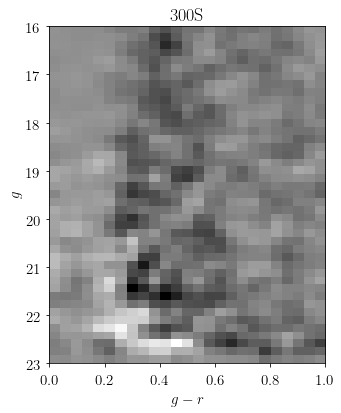

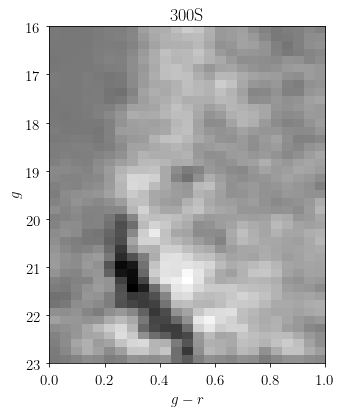

In [257]:
import plot_hess
plot_hess.plot_hess( '300S', data300[on], data300[off], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23)
plot_hess.plot_hess('300S', data300[on], data300[off2], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23)

(0, 0)
14.488135456452207


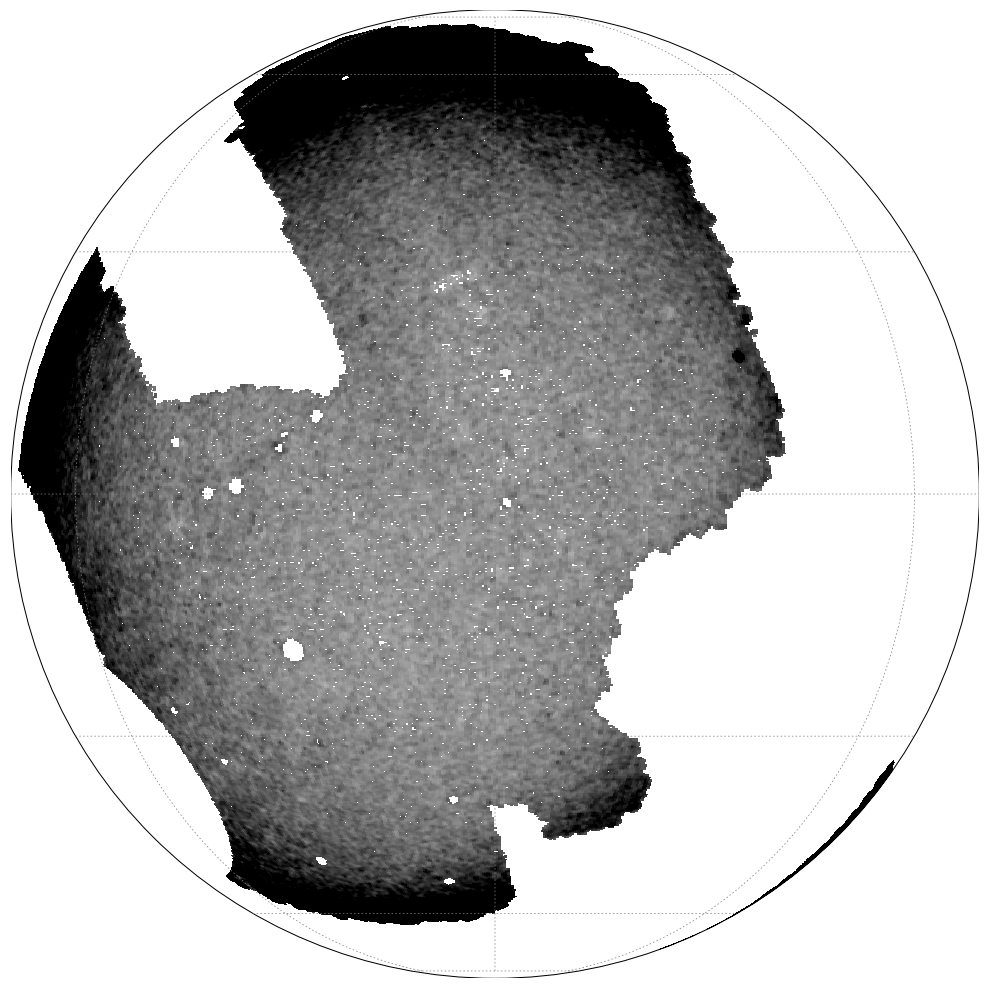

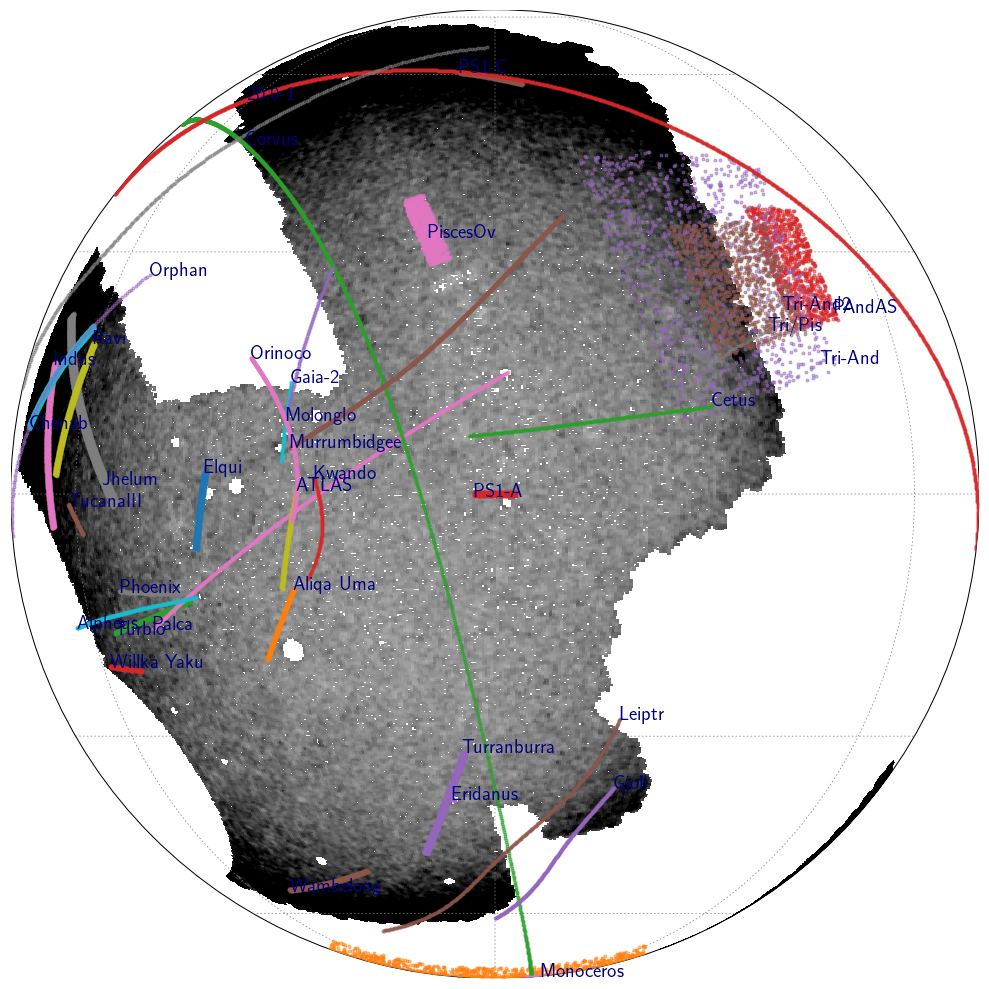

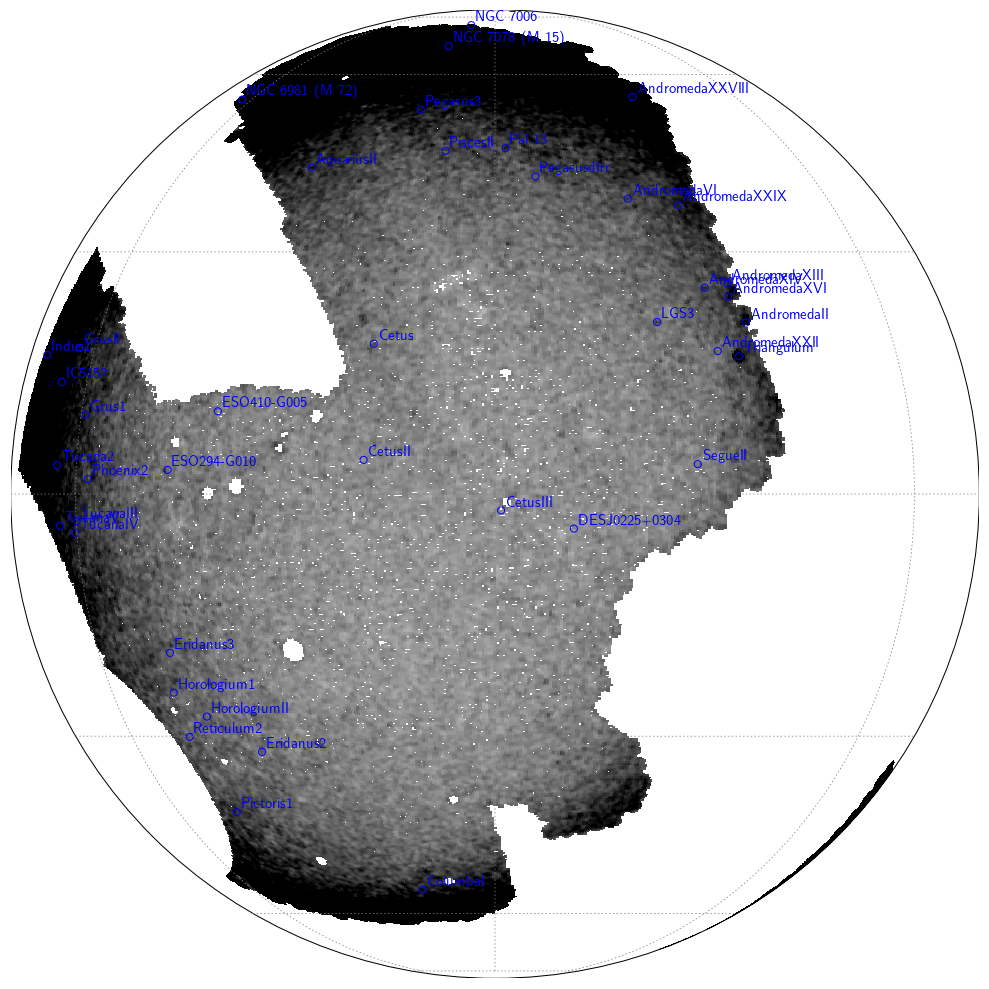

In [45]:
reload(plot_density)
reload(streamlib)

stream = 'PS1-A'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 7
xsize = 1000

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [ ]:
reload(plot_density)
reload(streamlib)

stream = 'ATLAS'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 7
xsize = 600

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

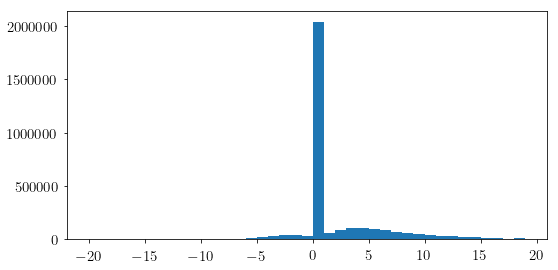

-11.233760868168329


In [67]:
plt.figure(figsize=(8,4))
plt.hist(data-bkg, bins=np.arange(-20,20))
plt.show()

print(np.min(data-bkg))

(-131.80355561967048, -78.84286539708054)
[-131.80355561967048, -90]
16.505149978319906


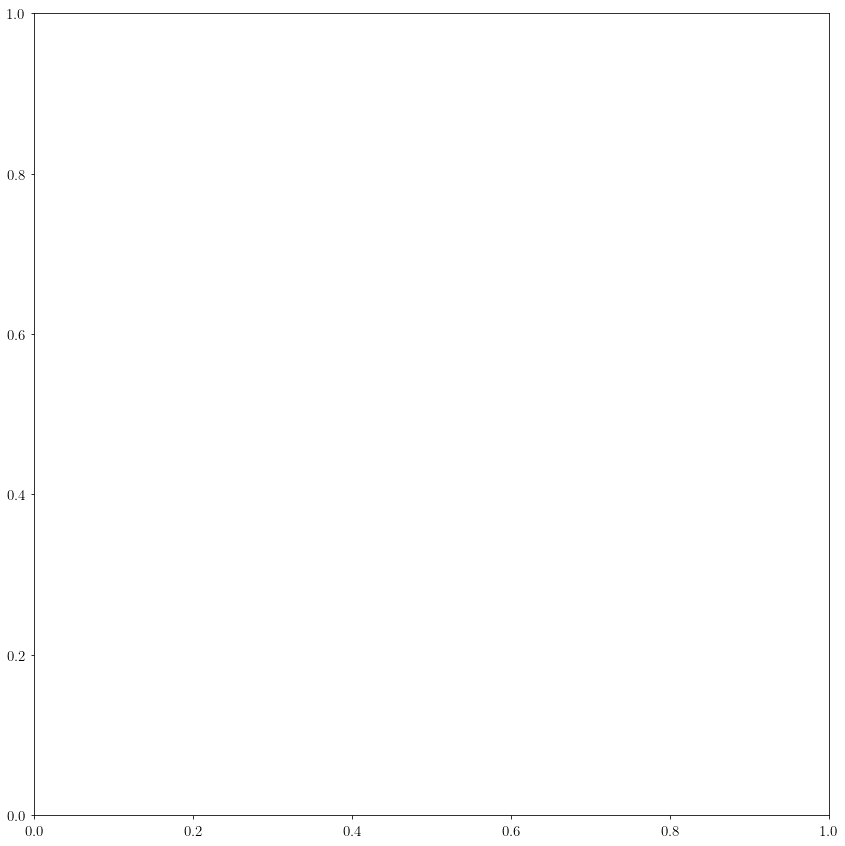

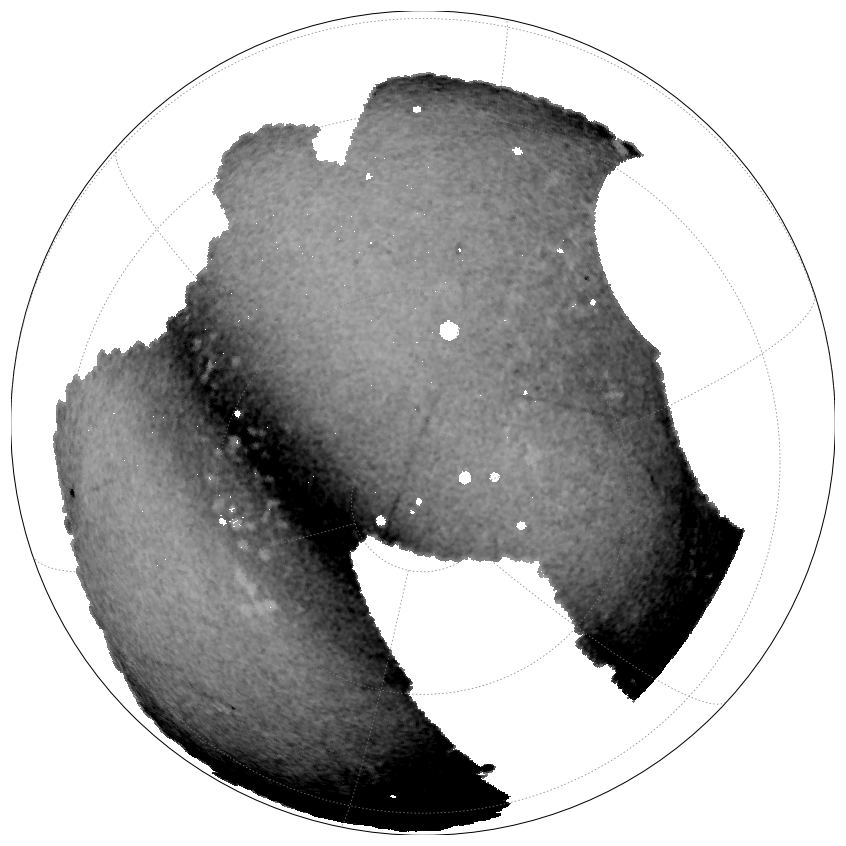

In [174]:
reload(plot_density)
reload(streamlib)

stream = 'ATLAS'
coords= 'gal'
sigma = 0.3
proj = 'ortho'

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)

background_center = [center[0], -90]
if background_center[1] > 90:
    background_center[1] -= 90
elif background_center[1] < -90:
    background_center[1] += 90
print(background_center)

mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)


vmin = 0
vmax = 7
xsize = 1000

for mu in [16]: # [14, 15, 16, 17, 18, 19]:
    data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
    bkg = plot_density.fit_background(data, center=background_center, coords=coords, coord_stream=stream, proj='ortho', sigma=sigma, deg=5)
    # # bkg = 0
    # smap = plot_density.plot_density(bkg, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords='cel', proj='ortho', xsize=xsize)
    # smap = plot_density.plot_density(data, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)

    vmin = -2
    vmax = 12

    smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
    # smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords=coords, proj='ortho', xsize=xsize)

    # smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
    # plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)
    # plt.savefig('../plots/decals/v3/density_atlas_gal_%i.png' %mu)

/Users/nora/projects/stream_search/code/plot_density.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter

/Users/nora/projects/stream_search/code/streamlib.py:589: DeprecationWarning: invalid escape sequence '\ '
  

/Users/nora/projects/stream_search/code/streamlib.py:710: DeprecationWarning: invalid escape sequence '\ '
  #    text = r"{\bf %s}"%(text.replace(' ','\ '))

(-170.35131366300416, -81.77039892854992)
16.628208964325893
/Users/nora/projects/stream_search/code/streamlib.py:327: AstropyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  mask=data.mask)

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/numpy/polynomial/polynomial.py:1104: RuntimeWarning: invalid value encountered in multiply
  v[0] = x*0 + 1

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-pac

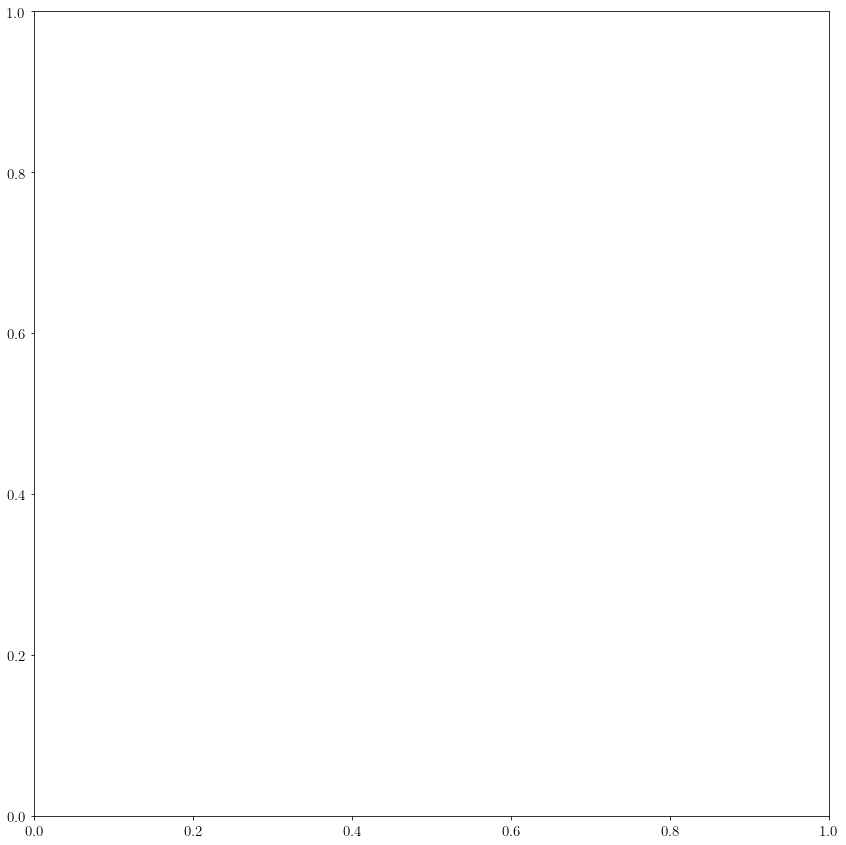

In [ ]:
import plot_density as plot_density
reload(plot_density)
reload(streamlib)

stream = 'AAU-ATLAS-L21'
coords= 'gal'
sigma = 0.3
proj = 'mbtfpq'

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].track.ra.value.mean(), mw_streams[stream].track.dec.value.mean())
elif coords == 'gal':
    center = (mw_streams[stream].track.galactic.l.value.mean(), mw_streams[stream].track.galactic.b.value.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].track.distance.value.mean())
print(mu)

vmin = 0
vmax = 15
xsize = 1000

for mu in [16]:
    data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
    bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)
    # # bkg = 0
    # smap = plot_density.plot_density(bkg, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords='cel', proj=proj, xsize=xsize)
    smap = plot_density.plot_density(data, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=xsize)

    vmin = -2
    vmax = 15

    smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=xsize)
    smap = plot_density.plot_density(bkg, 0, center=center, vmax=10, coords='cel', proj=proj, xsize=xsize)

    # smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=xsize)
    # plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)
    # plt.savefig('../plots/decals/v3/density_atlas_gal_%i.png' %mu)

In [55]:
mw_streams['AAU-ATLAS-L21'].track.distance

<Distance [24.92884152, 24.9246843 , 24.92052829, ..., 18.52808134,
           18.52678769, 18.52549526] kpc>

(0, 0)
16.712113404111033


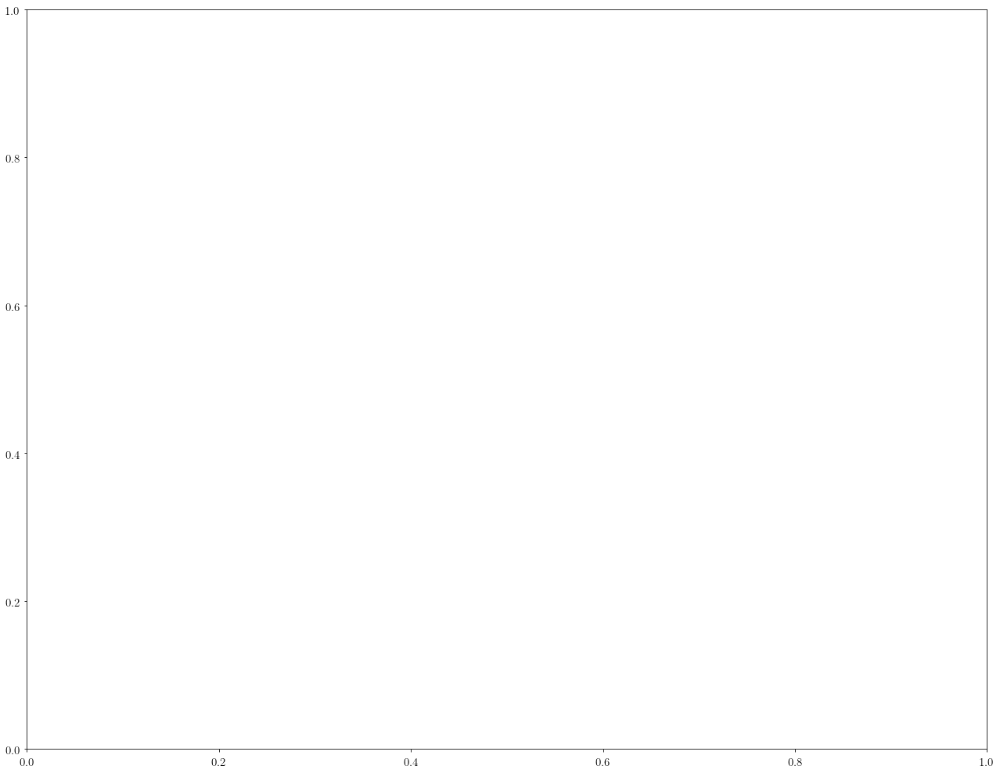

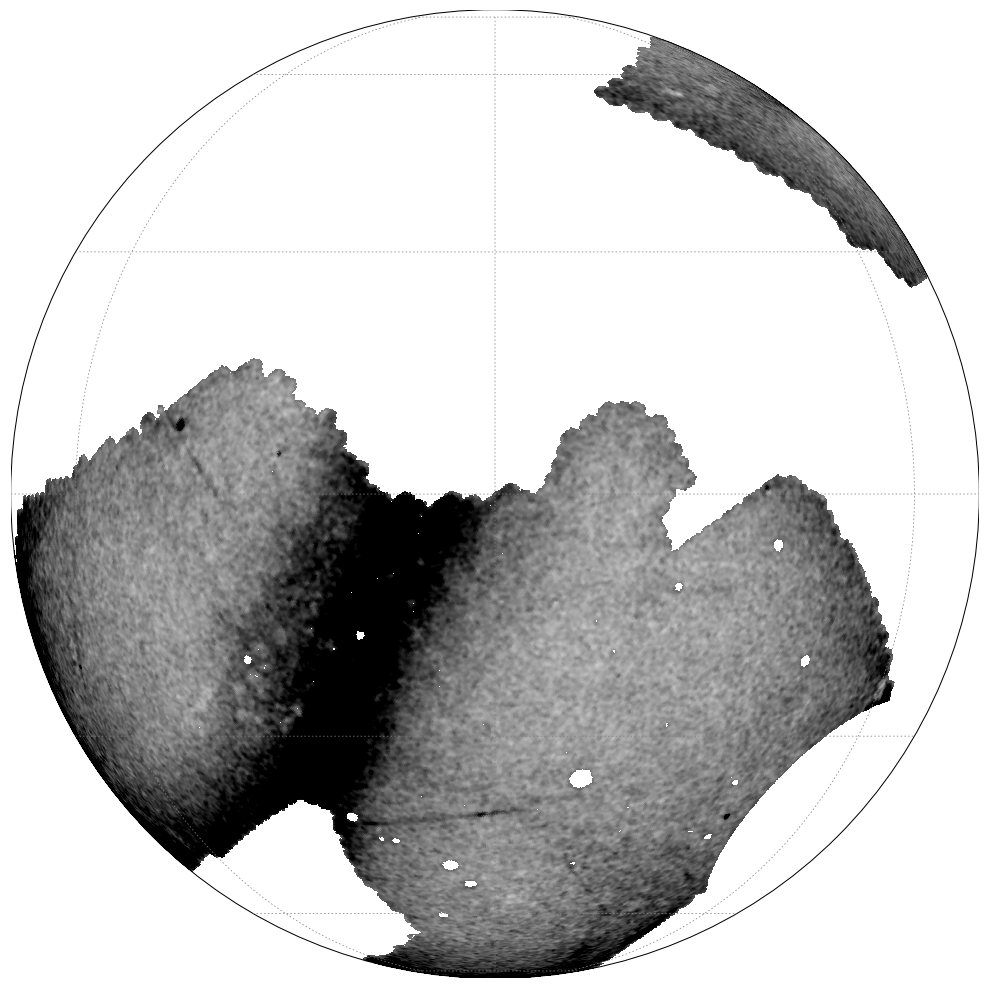

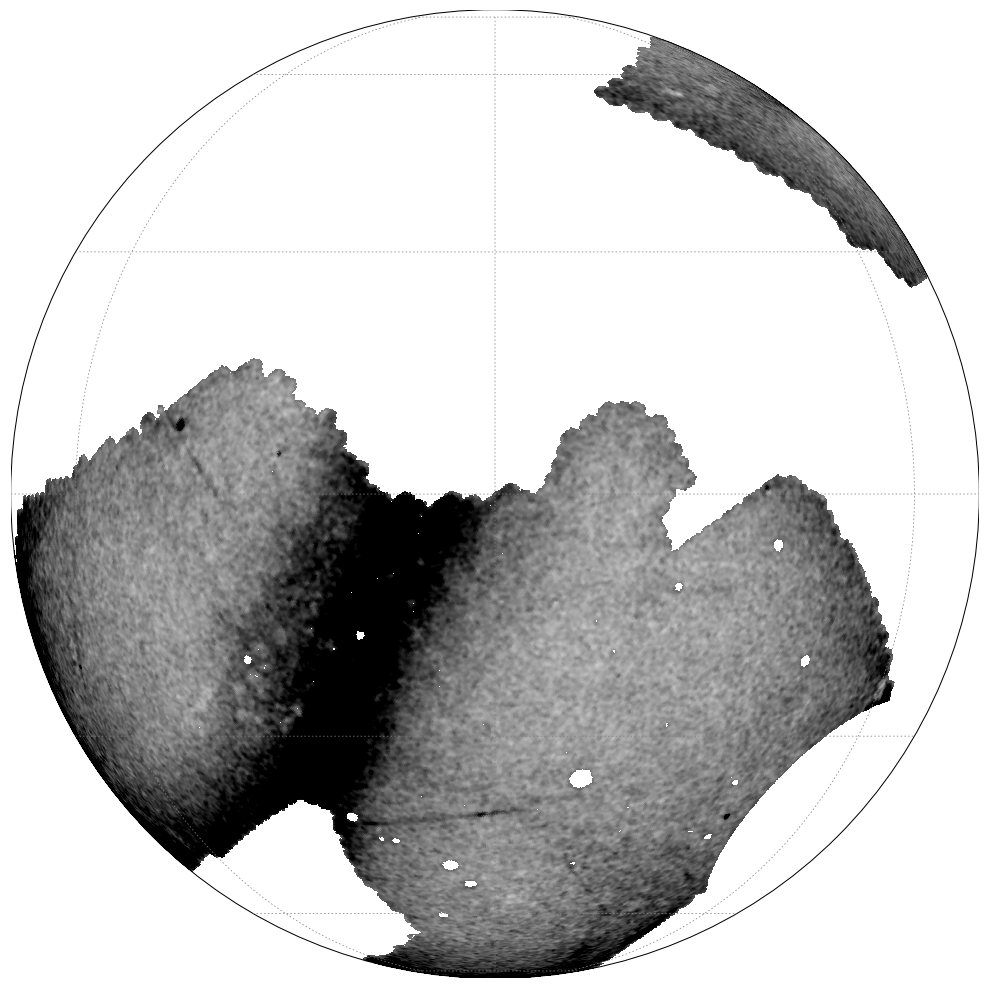

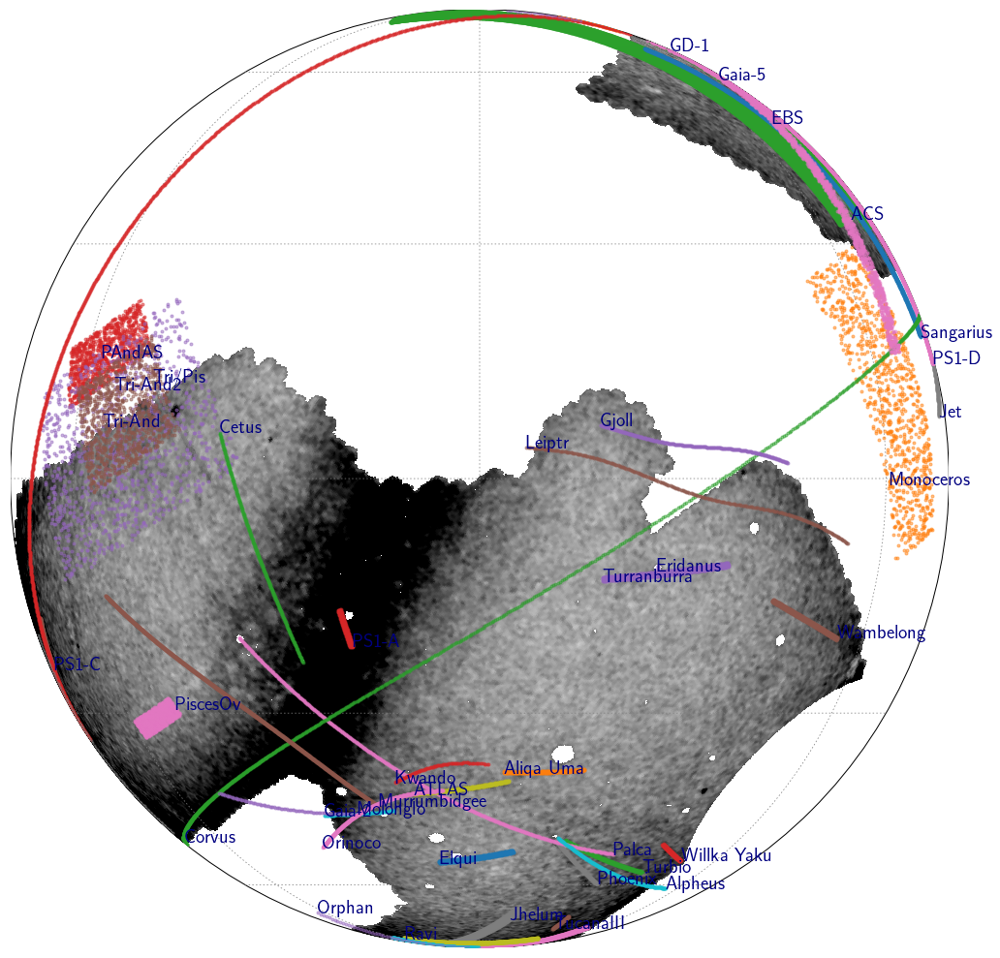

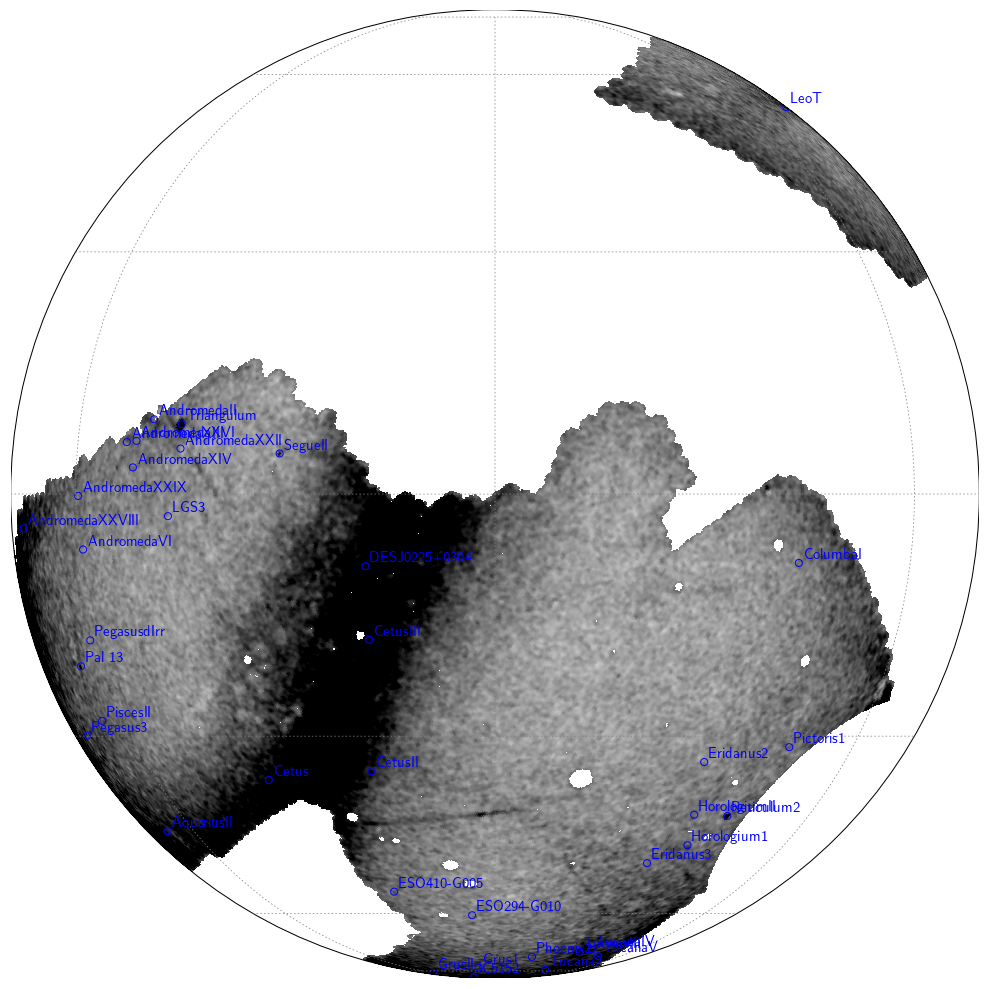

In [26]:
reload(plot_density)
reload(streamlib)

stream = 'Pal5'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)

mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 7
xsize = 600

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize=600)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize=600)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize=600)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize=600)
plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize=600)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [98]:
stream_cls.ends

ACS


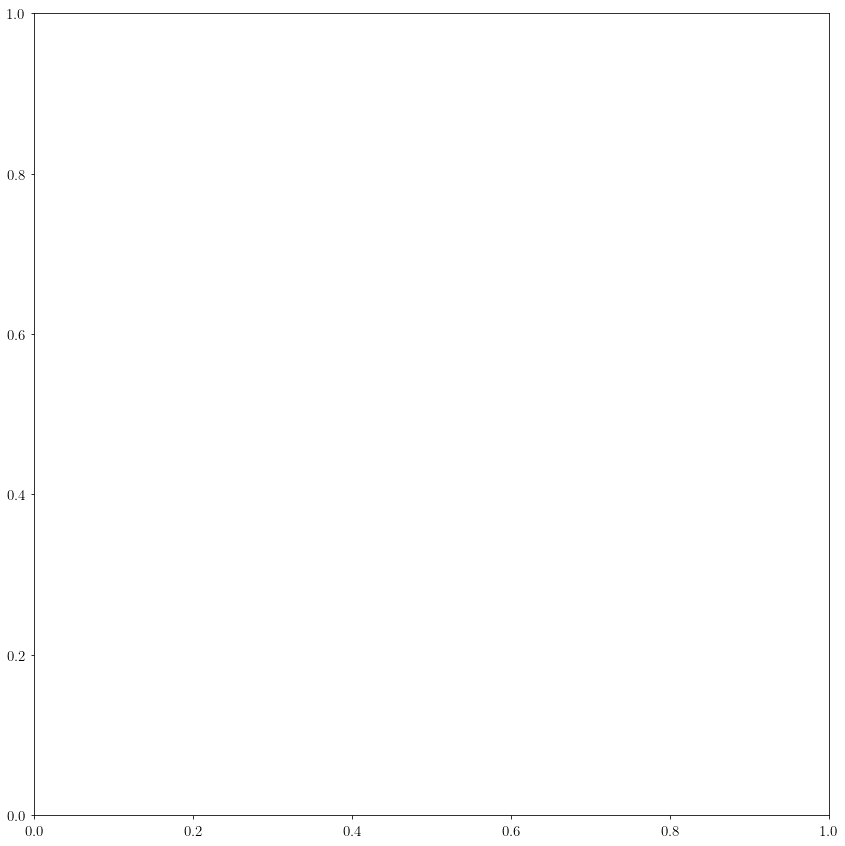

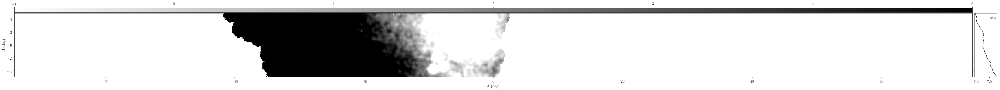

In [191]:
reload(plot_density)
reload(streamlib)
# plot_density.plot_stream_zoom(hpxcube, fracdet, modulus, stream='ACS', width=0.3, sigma=0.2, delta=0.1, vmin=-1, vmax=5)


# ends = [(mw_streams[stream].end_f.ra.value, mw_streams[stream].end_f.dec.value),
#         (mw_streams[stream].end_o.ra.value, mw_streams[stream].end_o.dec.value)]
# mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
# plot_density.plot_stream_zoom(hpxcube, fracdet, modulus, stream=None, ends=ends, mu=mu, width=0.3, sigma=0.2, delta=0.1, vmin=-1, vmax=5)

(0, 0)
15.569716761534185
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe


KeyboardInterrupt: 

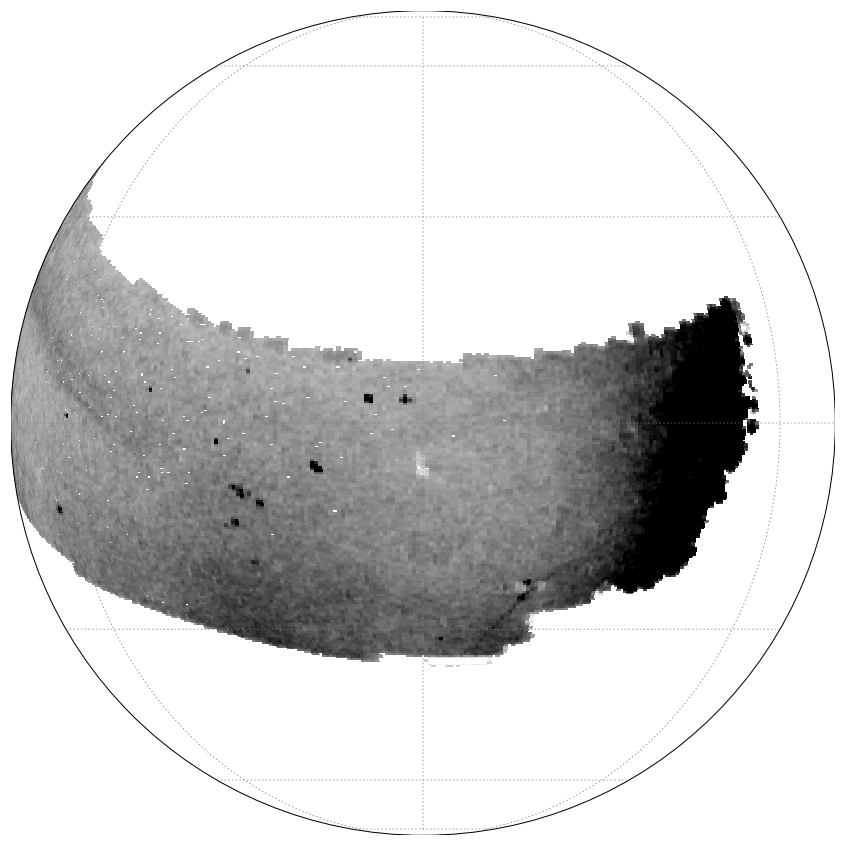

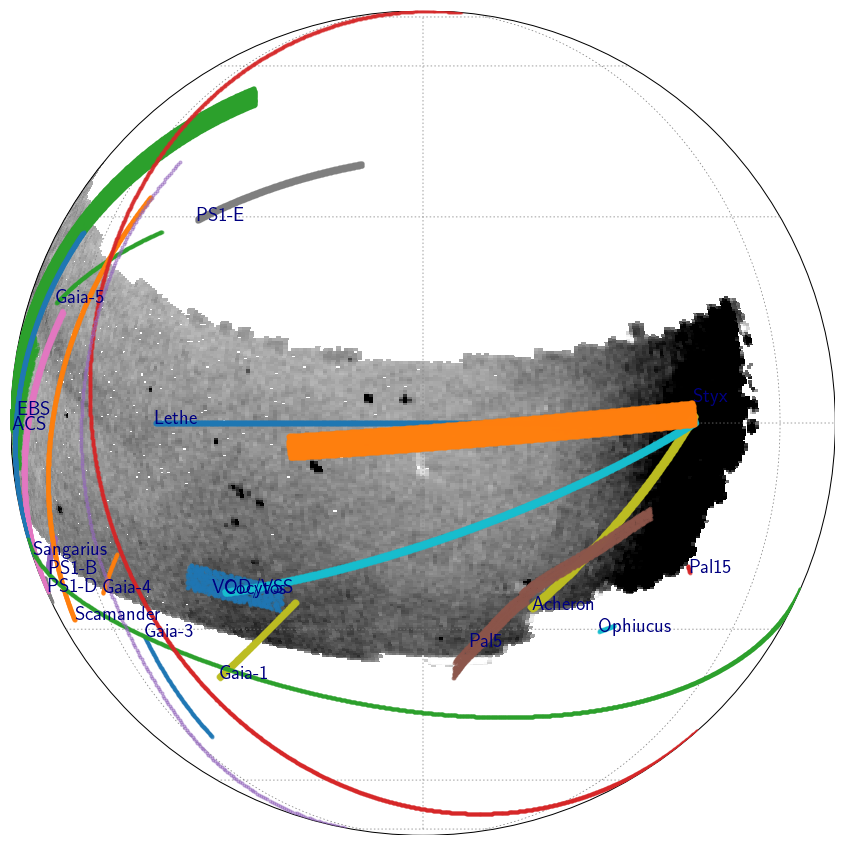

In [30]:
reload(plot_density)
reload(streamlib)

stream = 'Lethe'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 15
xsize = 600

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [ ]:
# %load_ext line_profiler

In [ ]:
%lprun -f smap.draw_hpxmap plot_density.plot_density(data, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=3000)

(0, 0)
16.202746241412996


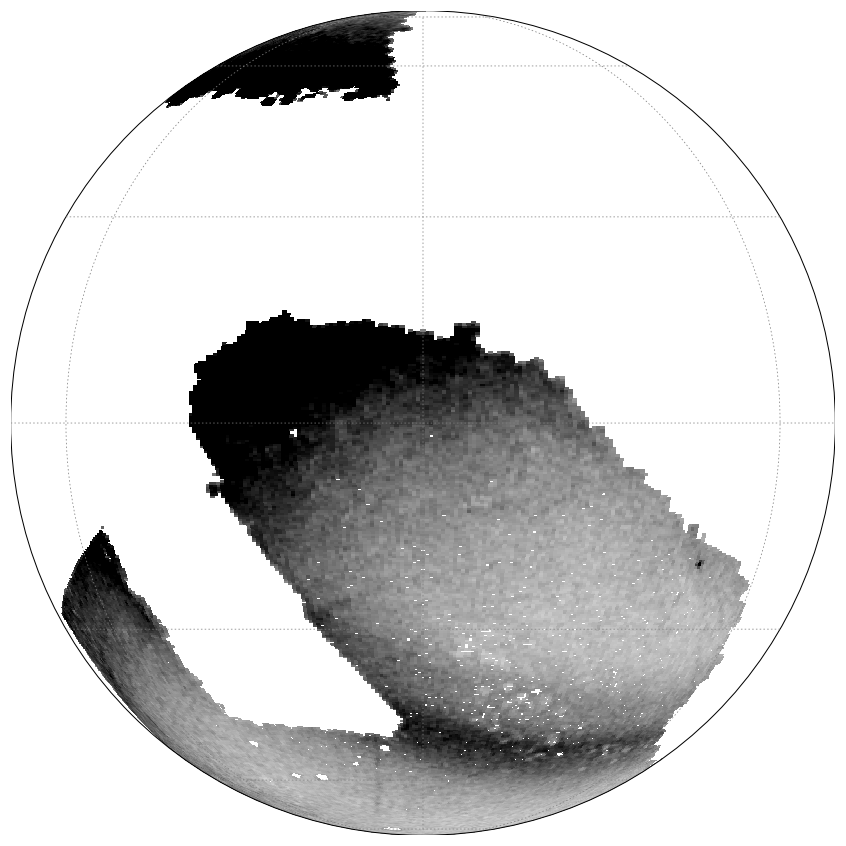

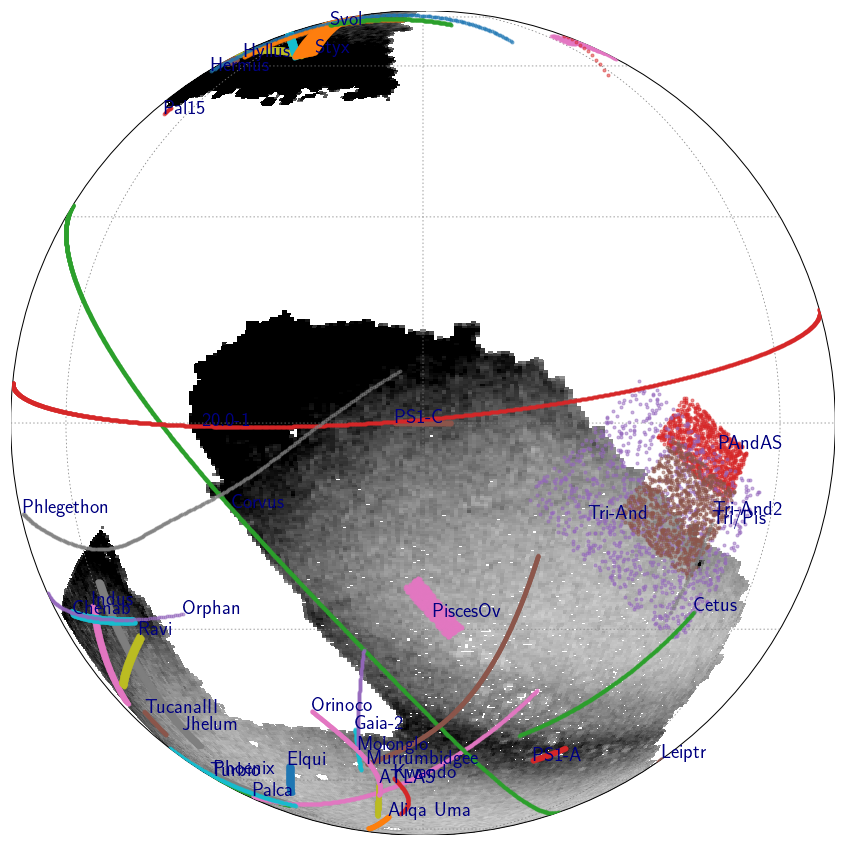

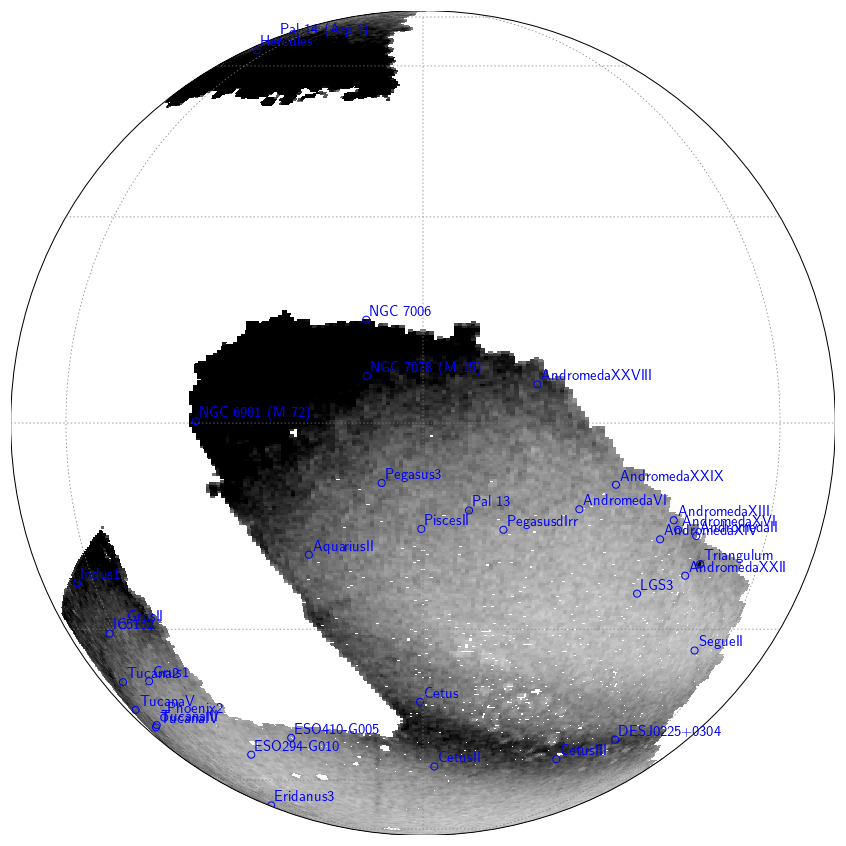

In [70]:
reload(plot_density)
reload(streamlib)

stream = 'PS1-C'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 15
xsize = 600

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

(-133.5740204426038, 22.805468856698184)
18.26606256887672


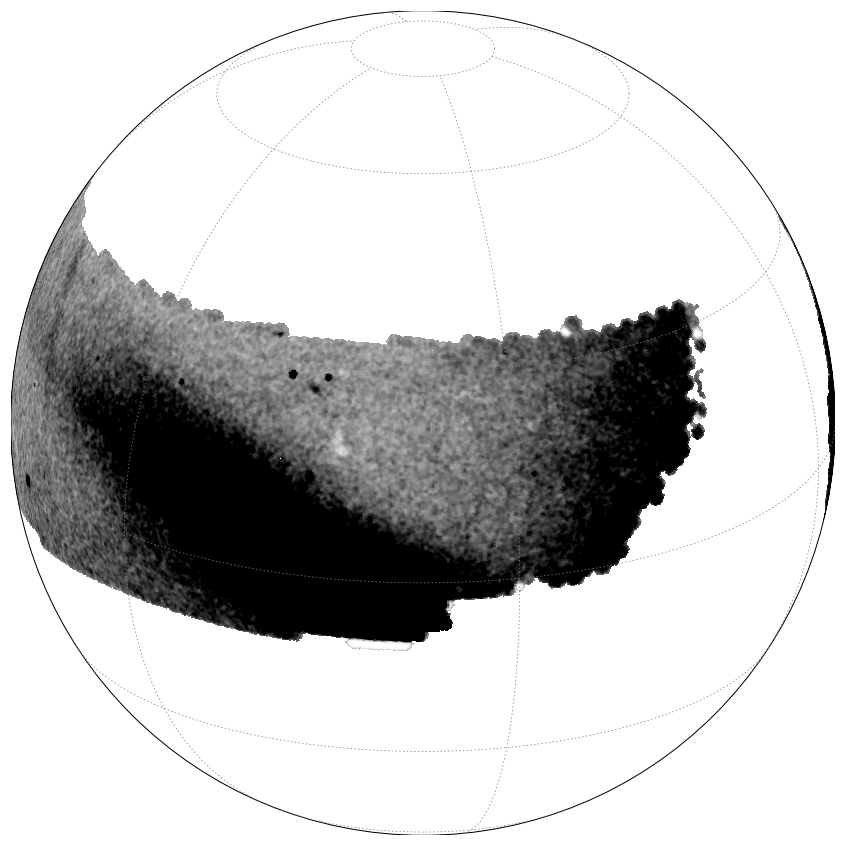

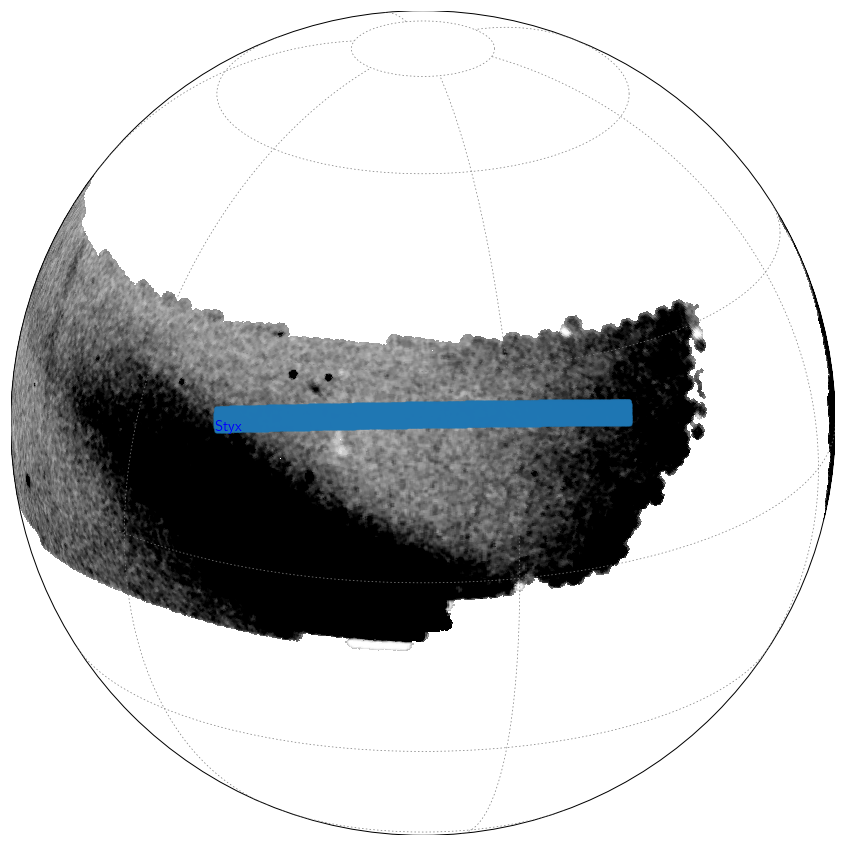

In [20]:
reload(plot_density)
reload(streamlib)

stream = 'Styx'
coords= 'cel'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 4
xsize = 2000

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [719]:
hp.npix2nside(len(data))

512

# Healpy

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/matplotlib/dviread.py:991: ResourceWarning: unclosed file <_io.BufferedWriter name=89>
  self._proc = self._new_proc()

/Users/nora/miniconda3/envs/py310/lib/python3.10/site-packages/matplotlib/dviread.py:991: ResourceWarning: unclosed file <_io.BufferedReader name=90>
  self._proc = self._new_proc()



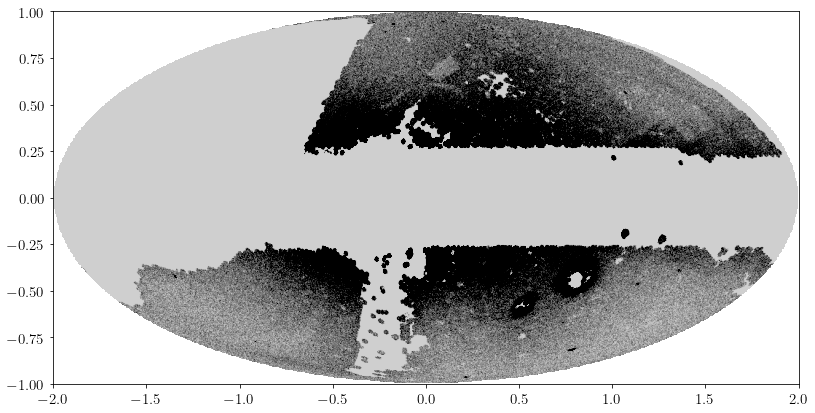

In [60]:
import healpy as hp

mu = 16.0
hpxmap = hpxcube[:,np.argmin(np.abs(mu-modulus))]

nside = hp.npix2nside(hpxmap.shape[0])
func = lambda x, y, z: hp.vec2pix(nside, x, y, z)

proj = hp.projector.MollweideProj(xsize=1024, rot=[266.4, -28.9, 59.0])
img = proj.projmap(hpxmap, func)


fig, ax = plt.subplots(1,1, figsize=(12, 6))
ax.imshow(img, origin='lower', vmin=-5, vmax=12, cmap='Greys', extent=proj.get_extent())
plt.show()

## ATLAS

In [100]:
import astropy.coordinates as coord
import gala.coordinates as gc

def zyx_euler_from_endpoints(lon1, lat1, lon2, lat2):
    c1 = coord.SkyCoord(lon1*u.deg, lat1*u.deg)
    c2 = coord.SkyCoord(lon2*u.deg, lat2*u.deg)
    fr = gc.GreatCircleICRSFrame.from_endpoints(c1, c2)
    origin = fr.realize_frame(coord.UnitSphericalRepresentation(0*u.deg, 0*u.deg))

    gc_icrs = origin.transform_to(coord.ICRS)
    R = gc.greatcircle.reference_to_greatcircle(coord.ICRS, fr)
    psi = -np.degrees(np.arctan2(R[2,1], R[2,2]))
   
    return [gc_icrs.ra.degree, gc_icrs.dec.degree, psi]

def get_vscale(img, q=[5, 95]):
    from astropy.stats import sigma_clip
   
    _tmp = img.ravel()
    stdfunc = lambda x,axis: 1.5*np.median(np.abs(x-np.median(x,axis=axis)), axis=axis)
    _tmp_clipped = sigma_clip(_tmp[_tmp != 0], stdfunc=stdfunc)
   
    return np.percentile(_tmp_clipped[_tmp_clipped > 0], q)

In [157]:
# xy = proj.ang2xy(ra, dec, lonlat=True)

reload(streamlib)
atlas = streamlib.load_stream.get_stream('ATLAS')
aliqa_uma = streamlib.load_stream.get_stream('Aliqa Uma')
phoenix = streamlib.load_stream.get_stream('Phoenix')
print(phoenix['ends'])
# print(mw_streams['Phoenix'].end_f, mw_streams['Phoenix'].end_o)
stream = mw_streams['Phoenix']
print([[stream.end_o.ra.deg, stream.end_o.dec.deg], [stream.end_f.ra.deg, stream.end_f.dec.deg]])

# print(aliqa_uma['ends'])
# print(atlas['ends'])

ends = atlas['ends']
# ends = [atlas['ends'][0], aliqa_uma['ends'][1]]
print(ends)

print([[19.465113557599395, -26.584615187212712], [31.04372386479431, -32.98118501241838]])
# 25.068645522575792 -29.909239371068143 -42.37229980876416
# m-M = 16.0

# phi, theta, psi = streamlib.results.euler_angles(atlas['ends'][0][0], atlas['ends'][0][1], atlas['ends'][1][0], atlas['ends'][1][1])
phi, theta, psi = zyx_euler_from_endpoints(ends[0][0], ends[0][1], ends[1][0], ends[1][1])
# print(phi, theta, psi)

[[20.08, -55.29], [27.88, -42.69]]
[[20.082460505880235, -56.996486198871246], [27.0343557428393, -45.05609871166725]]
[[9.29, -20.9], [30.71, -33.19]]
[[19.465113557599395, -26.584615187212712], [31.04372386479431, -32.98118501241838]]


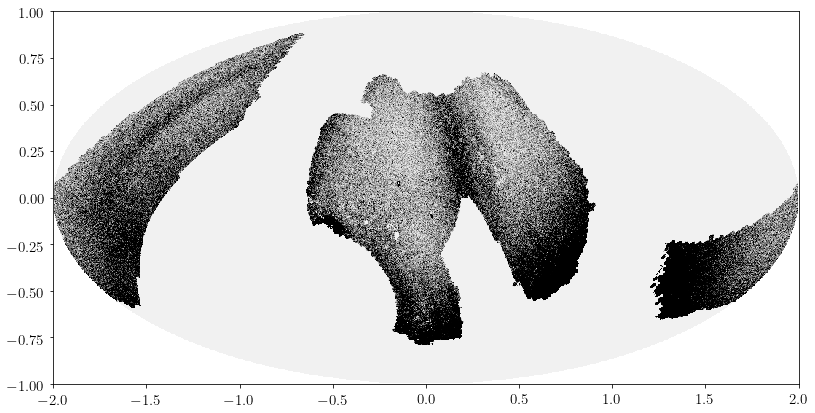

In [86]:
import healpy as hp

mu = 16.0
hpxmap = np.sum(hpxcube[:,np.argmin(np.abs(mu-modulus))-5:np.argmin(np.abs(mu-modulus))+5], axis=1)

nside = hp.npix2nside(hpxmap.shape[0])
func = lambda x, y, z: hp.vec2pix(nside, x, y, z)

proj = hp.projector.MollweideProj(xsize=1024, rot=[phi, theta, psi])
img = proj.projmap(hpxmap, func)


fig, ax = plt.subplots(1,1, figsize=(12, 6))
ax.imshow(img, origin='bottom', vmin=-10, vmax=80, cmap='Greys', extent=proj.get_extent())
plt.show()

In [103]:
from healpy.sphtfunc import smoothing
dmu = 0.1
for mu in np.arange(15, 18+dmu/2., dmu):
# for mu in [17.0]:
    print('m-M = %.1f' %mu)
    hpxmap = hpxcube[:,np.argmin(np.abs(mu-modulus))]
    nside = hp.npix2nside(hpxmap.shape[0])
    func = lambda x, y, z: hp.vec2pix(nside, x, y, z)

    hpxmap_smooth = hp.smoothing(hpxmap, sigma=np.radians(0.12), verbose=False)
    proj = hp.projector.GnomonicProj(xsize=1024, ysize=512, rot=[phi, theta, psi], reso=3.0)
    img = proj.projmap(hpxmap_smooth, func)

    vmin, vmax = get_vscale(img, q=[1, 95])
    print(vmin, vmax)
    
    fig, ax = plt.subplots(1,1, figsize=(12, 6))
    ax.imshow(img, origin='bottom', vmin=vmin, vmax=vmax, cmap='Greys', extent=proj.get_extent())
    plt.title('m-M = %.1f' %mu)
    
    plt.savefig('../plots/atlas/atlas_aliqa_uma_%.1f.png' %(mu))
    plt.close('all')
    
# plt.show()

m-M = 15.0
0.00022318058884840397 4.509485692422737
m-M = 15.1
0.0002093020454637218 4.700494218358343
m-M = 15.2
0.00023355024806281932 4.945183520623456
m-M = 15.3
0.00021902808593443623 5.2821439462727575
m-M = 15.4
0.00021142104897053926 5.7007076564355295
m-M = 15.5
0.00023928934993044945 6.237635586272581
m-M = 15.6
0.00023297274466527185 6.817490703374901
m-M = 15.7
0.00026033744388831437 7.4272944254250906
m-M = 15.8
0.00026028478653161713 8.031471303586898
m-M = 15.9
0.00025577685997964423 8.583830946814805
m-M = 16.0
0.0002702755651298183 9.0551018965546
m-M = 16.1
0.00025646812302237976 9.443376648880713
m-M = 16.2
0.00026101589917670864 9.71867208447847
m-M = 16.3
0.00027490290652965044 9.823659337573442
m-M = 16.4
0.00024696547150115933 9.808921156915453
m-M = 16.5
0.0002544999604563447 9.669183758496134
m-M = 16.6
0.00025183465674905037 9.450193479789569
m-M = 16.7
0.00023316513228999192 9.117696376652
m-M = 16.8
0.00022684008316842252 8.753903230283111
m-M = 16.9
0.00022

In [370]:
atlas = data = fitsio.open('../data/cutouts/ATLAS_cutout.fits')[1].data

In [371]:
stream = mw_streams['ATLAS']
ends = [[stream.end_f.ra.deg, stream.end_f.dec.deg], [stream.end_o.ra.deg, stream.end_o.dec.deg]]

In [372]:
import rotation_matrix
R = np.array(streamlib.get_rotmat(ends=ends))
phi1, phi2 = rotation_matrix.phi12_rotmat(atlas['ra'], atlas['dec'], R)

In [373]:
def atlas_ridgeline(L):
    B = -0.00357383 * L ** 2 + 0.00593217 * L + 0.66463043
    return B

dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833
dx, dy =  0.02 0.0833


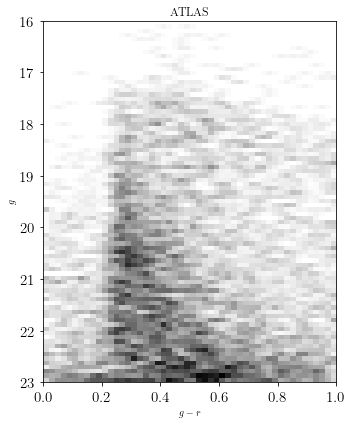

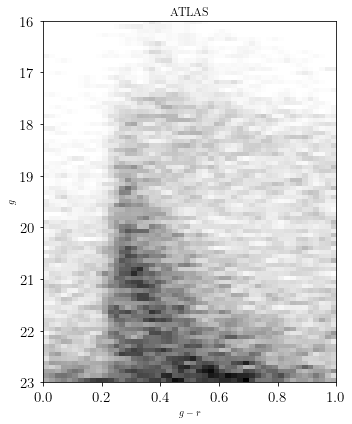

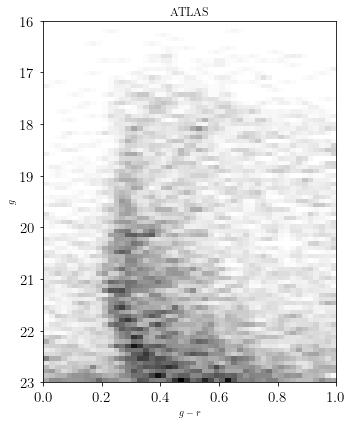

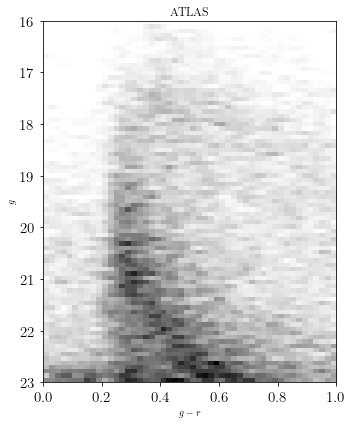

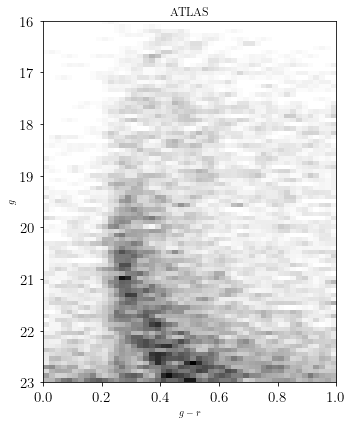

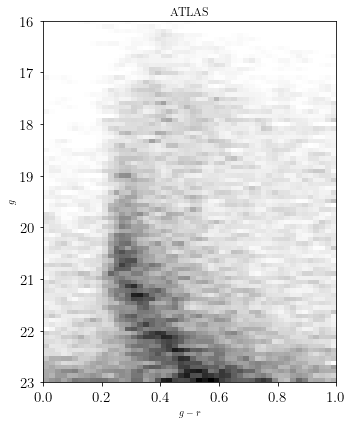

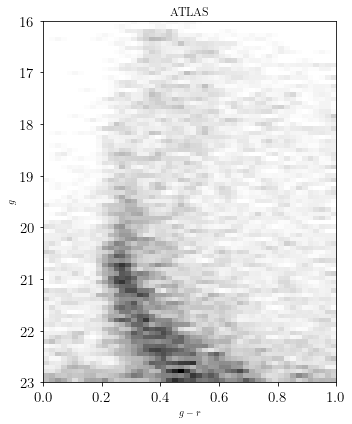

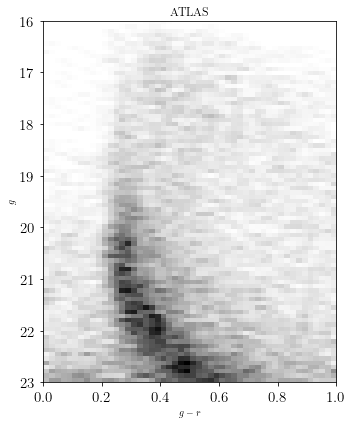

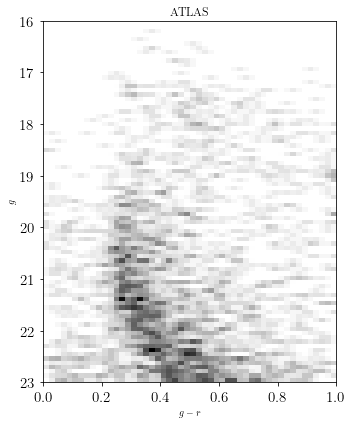

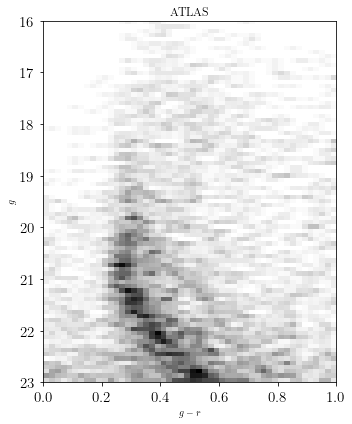

In [360]:
import plot_hess
reload(plot_hess)

sels_on = []
sels_off = []

dx = 5
width_on = 1.2
width_off = 1.2
separation = 1.5
off_min = separation - width_off / 2.
off_max = separation + width_off / 2.

for x in np.arange(-10.5, 10.5, dx):
    sel_on = (phi1 > x) & (phi1 < x + dx) & (np.abs(atlas_ridgeline(phi1) - phi2) < width_on/2.)
    sel_off = (phi1 > x) & (phi1 < x + dx) & (np.abs(phi2 - atlas_ridgeline(phi1)) < off_max) & (np.abs(phi2 - atlas_ridgeline(phi1)) > off_min)

#     sel_off = (phi1 > x) & (phi1 < x + dx) & ((atlas_ridgeline(phi1) - phi2) > off_min) & ((atlas_ridgeline(phi1) - phi2) < off_max)
#     sel_off = ((phi1 > x) & (phi1 < x + dx) & ((atlas_ridgeline(phi1) - phi2) > (-separation + width_off/2.)) & ((atlas_ridgeline(phi1) - phi2) > (-separation - width_off/2.)))
    sels_on.append(sel_on)
    sels_off.append(sel_off)
    plot_hess.plot_hess( 'ATLAS', atlas[sel_on], atlas[sel_off], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23, dx=0.04/2., dy=0.1666/2., no_bkg=True, smoothing=(.75, .25))
    plot_hess.plot_hess( 'ATLAS', atlas[sel_off], atlas[sel_on], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23, dx=0.04/2., dy=0.1666/2., no_bkg=True, smoothing=(.75, .25))
plt.show()

In [374]:
# ATLAS Track

track = [[8.878511495205403, -20.6494070621997], [9.146114178117175, -20.663019231121936], [10.698808548985284, -21.50901210163842], [12.230259294782117, -22.28620196535418], [13.785268579552792, -23.322446643615365], [15.89078480584634, -24.43335499119341], [17.766364442418485, -25.52688481725896], [19.99603487912223, -26.739815876745922], [21.67643421930574, -27.802160791091524], [23.471604370269997, -28.778081088890843], [25.15523774946084, -29.873591681829836], [26.792153362554675, -30.883757811955363], [28.704607796456266, -31.922617532732573], [28.704607796456266, -31.922617532732573]]
ra_track, dec_track = [[ i for i, j in track ], 
                       [ j for i, j in track ]]

In [395]:
from scipy.interpolate import interp1d

phi1_track, phi2_track = rotation_matrix.phi12_rotmat(np.asarray(ra_track), np.asarray(dec_track), R)

interp_track = interp1d(phi1_track, phi2_track, fill_value='extrapolate')

In [396]:
phi1_track.min(), phi1_track.max(), phi2_track.min(), phi2_track.max()

(-3.7115554390441745,
 17.253015378100066,
 -0.19035641632483083,
 1.1829345346526712)

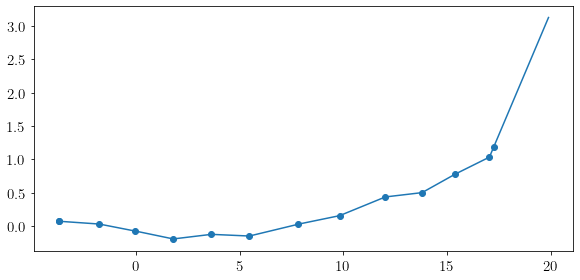

In [397]:
plt.figure(figsize=(8,4))
plt.scatter(phi1_track, phi2_track)
xx = np.arange(-5, 20, 0.1)
plt.plot(xx, interp_track(xx))
plt.show()

In [393]:
phi1_track.max()

17.253015378100066

-3.7115554390441745 1.2884445609558255
dx, dy =  0.02 0.0833
1.2884445609558255 6.288444560955826
dx, dy =  0.02 0.0833
6.288444560955826 11.288444560955826
dx, dy =  0.02 0.0833
11.288444560955826 16.288444560955824
16.288444560955824 21.288444560955824


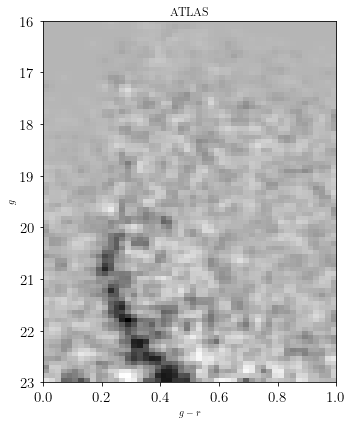

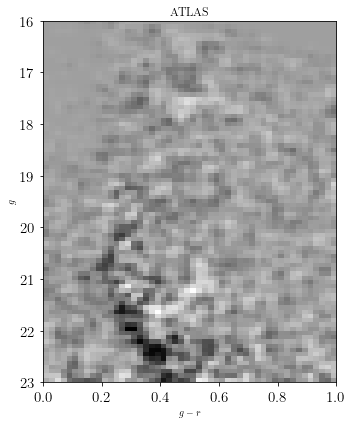

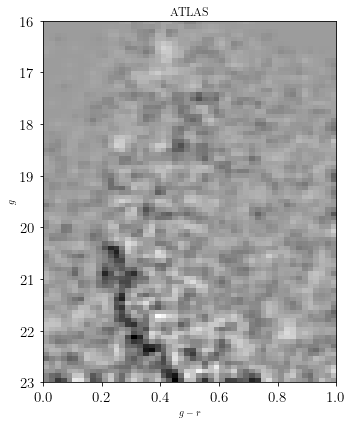

In [401]:
import plot_hess
reload(plot_hess)

sels_on = []
sels_off = []

dx = 5
width_on = 1.2
width_off = 1.2
separation = 1.5
off_min = separation - width_off / 2.
off_max = separation + width_off / 2.

for x in np.arange(phi1_track.min(), phi1_track.max(), dx):
    print(x, x+dx)
    sel_on = (phi1 > x) & (phi1 < x + dx) & (np.abs(interp_track(phi1) - phi2) < width_on/2.)
    sel_off = (phi1 > x) & (phi1 < x + dx) & (np.abs(phi2 - interp_track(phi1)) < off_max) & (np.abs(phi2 - interp_track(phi1)) > off_min)
    if sel_on.sum() == 0 or sel_off.sum() == 0:
        continue
    
#     sel_off = (phi1 > x) & (phi1 < x + dx) & ((atlas_ridgeline(phi1) - phi2) > off_min) & ((atlas_ridgeline(phi1) - phi2) < off_max)
#     sel_off = ((phi1 > x) & (phi1 < x + dx) & ((atlas_ridgeline(phi1) - phi2) > (-separation + width_off/2.)) & ((atlas_ridgeline(phi1) - phi2) > (-separation - width_off/2.)))
    sels_on.append(sel_on)
    sels_off.append(sel_off)
    plot_hess.plot_hess( 'ATLAS', atlas[sel_on], atlas[sel_off], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23, dx=0.04/2., dy=0.1666/2., smoothing=(0.75, 0.25))
    
plt.show()

[[19.465113557599395, -26.584615187212712], [31.04372386479431, -32.98118501241838]]
25.068645522575792 -29.909239371068143 -42.37229980876416
m-M = 16.5


(-0.34862951808586734, 0.34862951808586734)

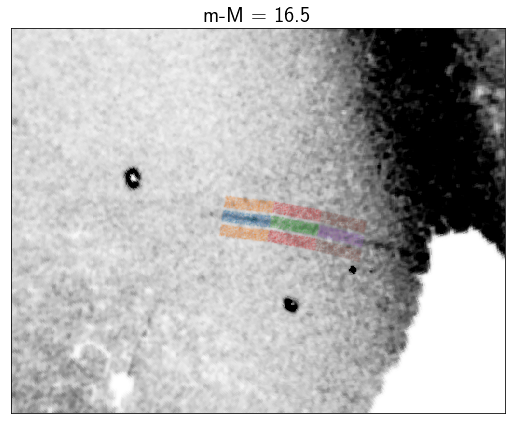

In [402]:
import plot_density_healpy
reload(plot_density_healpy)

stream = 'ATLAS'
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

ax, proj = plot_density_healpy.plot_stream(stream, hpxcube, modulus, mu_min=mu, mu_max=mu, save=False)
xlim = ax.get_xlim()
ylim = ax.get_ylim()

for i, sel in enumerate(sels_on):
    xy = proj.ang2xy(data['ra'][sel], data['dec'][sel], lonlat=True)
    ax.plot(xy[0][::10], xy[1][::10], '.', ms=2, alpha=0.05)

    sel = sels_off[i]
    xy = proj.ang2xy(data['ra'][sel], data['dec'][sel], lonlat=True)
    ax.plot(xy[0][::10], xy[1][::10], '.', ms=2, alpha=0.05)
    
ax.set_xlim(xlim[0], xlim[1])
ax.set_ylim(ylim[0], ylim[1])

# Phoenix

In [406]:
stream = 'Phoenix'
data = fitsio.open('../data/cutouts/%s_cutout.fits' %stream.replace(' ', '_'))[1].data

In [407]:
stream = mw_streams[stream]
ends = [[stream.end_f.ra.deg, stream.end_f.dec.deg], [stream.end_o.ra.deg, stream.end_o.dec.deg]]

R = np.array(streamlib.get_rotmat(ends=ends))
phi1, phi2 = rotation_matrix.phi12_rotmat(data['ra'], data['dec'], R)

In [408]:
# Phoenix Track

track = [[18.42026961921261, -56.40210322782167], [19.1500923958647, -56.05994762407346], [20.22641462372487, -54.98081231700294], [21.593299966059092, -53.11399434440662], [23.96577798057636, -49.67356488310648], [25.186679700233714, -48.43276442239332], [26.347734981193014, -46.955151107379464], [27.381002155517347, -44.60328704900704], [28.013739382142067, -41.78047764737971], [28.871038569937866, -40.09009368686728], [29.469089873965803, -37.61779741061436], [29.85747228618782, -36.02683322410272], [31.031467151972855, -33.12093519863218], [31.031467151972855, -33.12093519863218]]
ra_track, dec_track = [[ i for i, j in track ], 
                       [ j for i, j in track ]]


phi1_track, phi2_track = rotation_matrix.phi12_rotmat(np.asarray(ra_track), np.asarray(dec_track), R)

interp_track = interp1d(phi1_track, phi2_track, fill_value='extrapolate')

-6.170365304420562 1.829634695579438
dx, dy =  0.02666666666666667 0.11106666666666666
dx, dy =  0.02666666666666667 0.11106666666666666
dx, dy =  0.02666666666666667 0.11106666666666666
1.829634695579438 9.829634695579438
dx, dy =  0.02666666666666667 0.11106666666666666
dx, dy =  0.02666666666666667 0.11106666666666666
dx, dy =  0.02666666666666667 0.11106666666666666
9.829634695579438 17.829634695579436
dx, dy =  0.02666666666666667 0.11106666666666666
dx, dy =  0.02666666666666667 0.11106666666666666
dx, dy =  0.02666666666666667 0.11106666666666666
17.829634695579436 25.829634695579436
dx, dy =  0.02666666666666667 0.11106666666666666
dx, dy =  0.02666666666666667 0.11106666666666666
dx, dy =  0.02666666666666667 0.11106666666666666


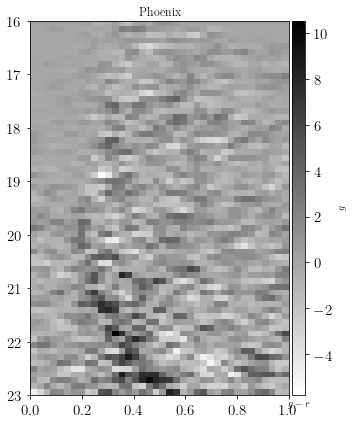

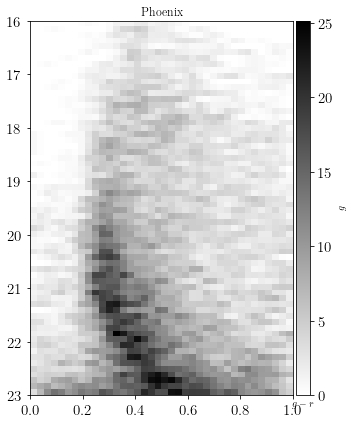

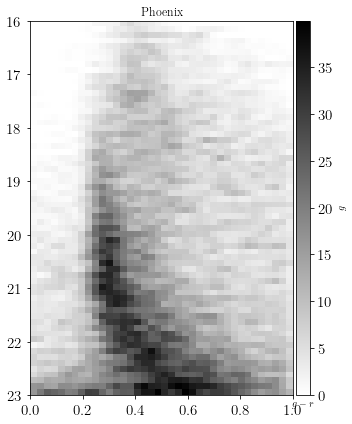

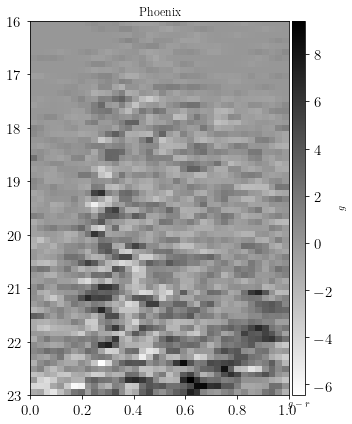

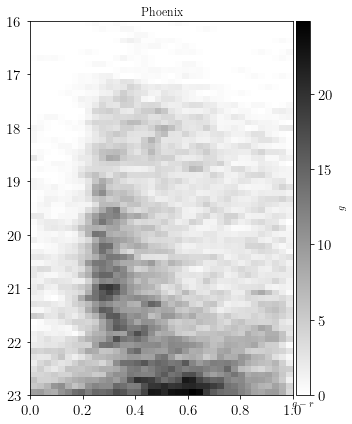

...

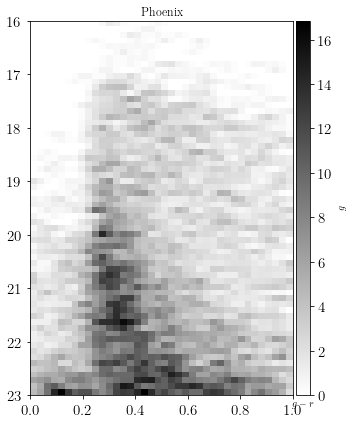

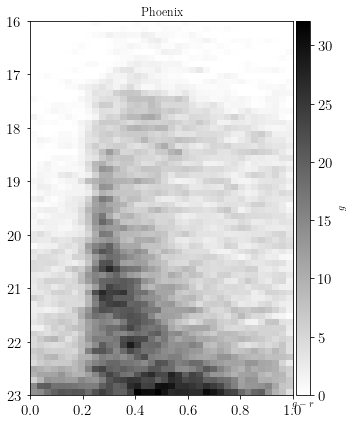

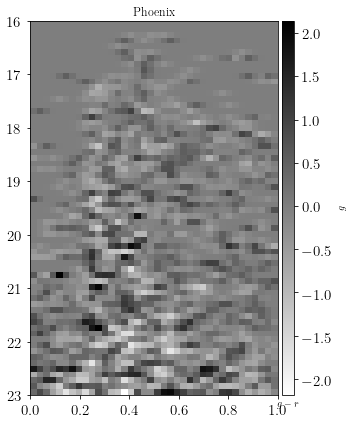

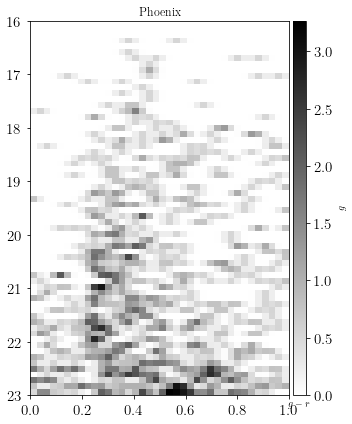

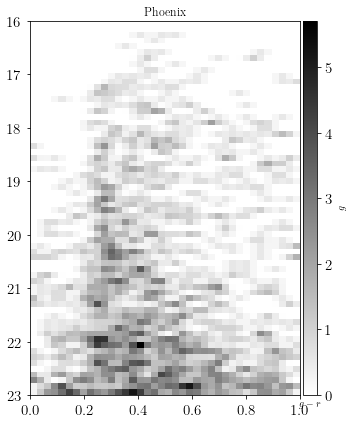

In [438]:
import plot_hess
reload(plot_hess)

sels_on = []
sels_off = []

dx = 8
width_on = 0.7
width_off = 0.7
separation = 0.7
off_min = separation - width_off / 2.
off_max = separation + width_off / 2.

for x in np.arange(phi1_track.min(), phi1_track.max(), dx):
    print(x, x+dx)
    sel_on = (phi1 > x) & (phi1 < x + dx) & (np.abs(interp_track(phi1) - phi2) < width_on/2.)
    sel_off = (phi1 > x) & (phi1 < x + dx) & (np.abs(phi2 - interp_track(phi1)) < off_max) & (np.abs(phi2 - interp_track(phi1)) > off_min)
    if sel_on.sum() == 0 or sel_off.sum() == 0:
        continue
    sels_on.append(sel_on)
    sels_off.append(sel_off)
    plot_hess.plot_hess( 'Phoenix', data[sel_on], data[sel_off], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23, dx=0.04/1.5, dy=0.1666/1.5, smoothing=(0.75, 0.25))
    plot_hess.plot_hess( 'Phoenix', data[sel_on], data[sel_off], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23, dx=0.04/1.5, dy=0.1666/1.5, no_bkg=True, smoothing=(.75, .25))
    plot_hess.plot_hess( 'Phoenix', data[sel_off], data[sel_on], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23, dx=0.04/1.5, dy=0.1666/1.5, no_bkg=True, smoothing=(.75, .25))

plt.show()

[[19.465113557599395, -26.584615187212712], [31.04372386479431, -32.98118501241838]]
25.068645522575792 -29.909239371068143 -42.37229980876416
m-M = 16.5


(-0.5810491968097788, 0.5810491968097788)

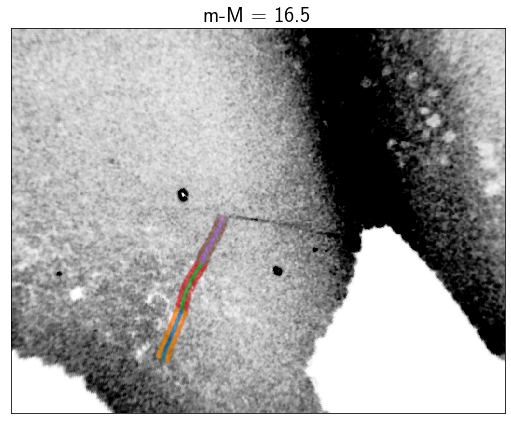

In [439]:
import plot_density_healpy
reload(plot_density_healpy)

stream = 'ATLAS'
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

ax, proj = plot_density_healpy.plot_stream(stream, hpxcube, modulus, mu_min=mu, mu_max=mu, save=False)
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# xy = proj.ang2xy(data['ra'], data['dec'], lonlat=True)
# ax.plot(xy[0], xy[1], ms=2, alpha=0.1)
for i, sel in enumerate(sels_on):
    xy = proj.ang2xy(data['ra'][sel], data['dec'][sel], lonlat=True)
    ax.plot(xy[0][::10], xy[1][::10], '.', ms=2, alpha=0.05)

    sel = sels_off[i]
    xy = proj.ang2xy(data['ra'][sel], data['dec'][sel], lonlat=True)
    ax.plot(xy[0][::10], xy[1][::10], '.', ms=2, alpha=0.05)
    
ax.set_xlim(xlim[0], xlim[1])
ax.set_ylim(ylim[0], ylim[1])

# General

[[19.465113557599395, -26.584615187212712], [31.04372386479431, -32.98118501241838]]
25.068645522575792 -29.909239371068143 -42.37229980876416
m-M = 16.5


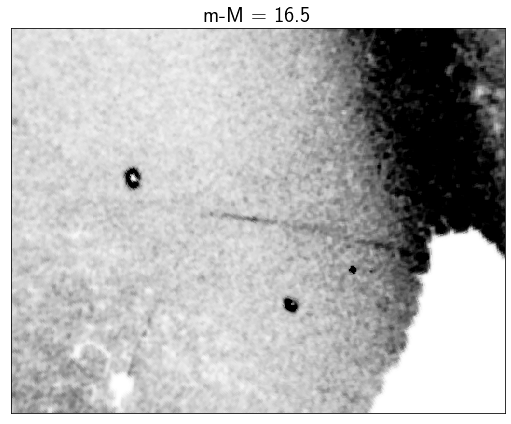

In [289]:
# %matplotlib notebook
%matplotlib inline
import plot_density_healpy
reload(plot_density_healpy)

stream = 'ATLAS'
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

ax, proj = plot_density_healpy.plot_stream(stream, hpxcube, modulus, mu_min=mu, mu_max=mu, save=False)

In [131]:
stream = mw_streams['Elqui']
ends = [[stream.end_f.ra.deg, stream.end_f.dec.deg], [stream.end_o.ra.deg, stream.end_o.ra.deg]]
print(ends)

[[10.692546510769665, -36.920890661200765], [20.493289526911568, 20.493289526911568]]


In [132]:
stream.name

'Elqui'

In [222]:
mw_streams['ATLAS'].end_f, mw_streams['ATLAS'].end_o

(<SkyCoord (ICRS): (ra, dec) in deg
     (19.46511356, -26.58461519)>, <SkyCoord (ICRS): (ra, dec) in deg
     (31.04372386, -32.98118501)>)

In [129]:
name = 'Elqui'
stream = streamlib.load_stream.get_stream(name)
ends = stream['ends']
print(ends)

# stream = mw_streams[name]

phi, theta, psi = zyx_euler_from_endpoints(ends[0][0], ends[0][1], ends[1][0], ends[1][1])
print(phi, theta, psi)

[[10.7, -36.9], [20.6, -42.4]]
15.452462557149355 -39.75505320589948 -48.515345062900714


In [115]:
dmu = 0.1
mu_min, mu_max = 17, 20

for mu in np.arange(mu_min, mu_max+dmu/2., dmu):
# for mu in [18.5]:
    print('m-M = %.1f' %mu)
    hpxmap = hpxcube[:,np.argmin(np.abs(mu-modulus))]
    nside = hp.npix2nside(hpxmap.shape[0])
    func = lambda x, y, z: hp.vec2pix(nside, x, y, z)

    hpxmap_smooth = hp.smoothing(hpxmap, sigma=np.radians(0.15), verbose=False)
    proj = hp.projector.GnomonicProj(xsize=1024, ysize=512, rot=[phi, theta, psi], reso=3.0)
    img = proj.projmap(hpxmap_smooth, func)

    vmin, vmax = get_vscale(img, q=[1, 95])
    
    fig, ax = plt.subplots(1,1, figsize=(12, 6))
    ax.imshow(img, origin='bottom', vmin=vmin, vmax=vmax, cmap='Greys', extent=proj.get_extent())
    plt.title('m-M = %.1f' %mu, fontsize=22)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    
    plt.savefig('../plots/%s/%s_%.1f.png' %(name, name, mu))
    plt.close('all')
    
# plt.show()

m-M = 17.0
m-M = 17.1
m-M = 17.2
m-M = 17.3
m-M = 17.4
m-M = 17.5
m-M = 17.6
m-M = 17.7
m-M = 17.8
m-M = 17.9
m-M = 18.0
m-M = 18.1
m-M = 18.2
m-M = 18.3
m-M = 18.4
m-M = 18.5
m-M = 18.6
m-M = 18.7
m-M = 18.8
m-M = 18.9
m-M = 19.0
m-M = 19.1
m-M = 19.2
m-M = 19.3
m-M = 19.4
m-M = 19.5
m-M = 19.6
m-M = 19.7
m-M = 19.8
m-M = 19.9
m-M = 20.0


[[258.94662494092074, 21.697409357909674], [194.01459608032377, 20.776906360456422]]
226.36680884044657 24.731196687192938 160.91986270657276
m-M = 18.3
(array([-0.54215821,  0.55195468]), array([ 0.21374162, -0.18672928]))


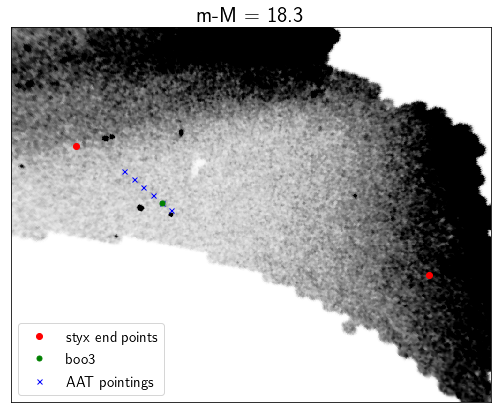

In [207]:
import plot_density_healpy
reload(plot_density_healpy)

stream = 'Styx'
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

# plot_density_healpy.plot_stream('Jhelum', hpxcube, modulus, mu_min=15, mu_max=17)
ax, proj = plot_density_healpy.plot_stream(stream, hpxcube001, modulus, mu_min=mu, mu_max=mu, save=False)

# xy = proj.ang2xy([194,259], [20,21], lonlat=True)
# print(xy)
# ax.plot(xy[0], xy[1], 'ro', label='styx end points')

# xy = proj.ang2xy(209.3, 26.8, lonlat=True)
# ax.plot(xy[0], xy[1], 'go', label='boo3', ms=5, zorder=100)

# ra = [201.7970943, 203.6104213, 205.4544768, 207.3307386, 209.3552298, 211.2980569]
# dec = [22.63485463, 23.74019884, 24.82403548, 25.88486202, 26.74924738, 27.75775852]
# xy = proj.ang2xy(ra, dec, lonlat=True)
# ax.plot(xy[0], xy[1], 'bx', label='AAT pointings', ms=5)
# plt.legend(loc='lower left')


In [485]:
import plot_density_healpy
reload(plot_density_healpy)

stream = 'Lethe'
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

plot_density_healpy.plot_stream(hpxcube, modulus, stream=stream, mu_min=mu, mu_max=mu, save=True, plot_streams=True, savedir='/Users/nora/projects/stream_search/plots/Lethe/')
plot_density_healpy.plot_stream(hpxcube, modulus, stream=stream, mu_min=14.0, mu_max=19.0, save=True, plot_streams=False, savedir='/Users/nora/projects/stream_search/plots/Lethe/')

15.569716761534185 15.569716761534185
[[257.74782547732667, 20.015988069599914], [171.31424819777962, 18.04581826261318]]
214.21174064116116 25.3281795935978 1.5842204380703548
m-M = 15.6
Saving /Users/nora/projects/stream_search/plots/Lethe/labeled_Lethe_15.6.png...
14.0 19.0
[[257.74782547732667, 20.015988069599914], [171.31424819777962, 18.04581826261318]]
214.21174064116116 25.3281795935978 1.5811911125524254
m-M = 14.0
Saving /Users/nora/projects/stream_search/plots/Lethe/Lethe_14.0.png...
m-M = 14.1
Saving /Users/nora/projects/stream_search/plots/Lethe/Lethe_14.1.png...
m-M = 14.2
Saving /Users/nora/projects/stream_search/plots/Lethe/Lethe_14.2.png...
m-M = 14.3
Saving /Users/nora/projects/stream_search/plots/Lethe/Lethe_14.3.png...
m-M = 14.4
Saving /Users/nora/projects/stream_search/plots/Lethe/Lethe_14.4.png...
m-M = 14.5
Saving /Users/nora/projects/stream_search/plots/Lethe/Lethe_14.5.png...
m-M = 14.6
Saving /Users/nora/projects/stream_search/plots/Lethe/Lethe_14.6.png...
m-

15.569716761534185 15.569716761534185
[[257.74782547732667, 20.015988069599914], [171.31424819777962, 18.04581826261318]]
214.21174064116116 25.3281795935978 163.74687368481784
m-M = 15.6


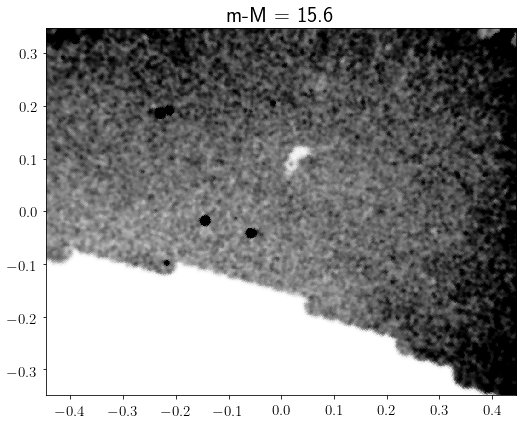

VOD/VSS
Monoceros
EBS
Her-Aq
PAndAS
Tri-And
Tri-And2
PiscesOv
EriPhe
Phoenix
Acheron
Cocytos
Lethe
Styx
ACS
Pal15
Eridanus
TucanaIII
Indus
Jhelum
Ravi
Chenab
Elqui
Aliqa_Uma
Turbio
Willka_Yaku
Turranburra
Wambelong
Palca
Jet
Gaia-1
Gaia-2
Gaia-3
Gaia-4
Gaia-5
PS1-A
PS1-B
PS1-C
PS1-D
PS1-E
ATLAS
Ophiucus
Sangarius
Scamander
Corvus
20.0-1
Sgr-L10
Orphan
Pal5
GD-1
Tri/Pis
NGC5466
Alpheus
Hermus
Hyllus
Cetus
Kwando
Molonglo
Murrumbidgee
Orinoco
Phlegethon
Slidr
Sylgr
Ylgr
Fimbulthul
Svol
Fjorm
Gjoll
Leiptr


(-0.34862951808586734, 0.34862951808586734)

In [457]:
import plot_density_healpy
reload(plot_density_healpy)

stream = 'Lethe'
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

ax, proj = plot_density_healpy.plot_stream(hpxcube, modulus, stream=stream, mu_min=mu, mu_max=mu, save=False, plot_streams=False)
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# print(ax)
# print(proj)
for stream_name in mw_streams.keys():
    if stream in ['Her-Aq', 'EriPhe', 'Sgr-L10']:
        continue
    mu_stream = plot_density.dist2mod(mw_streams[stream_name].Rhel[0])
    if np.abs(mu - mu_stream) < 100:
        print(stream_name)
        x, y = proj.ang2xy(mw_streams[stream_name].ra, mw_streams[stream_name].dec, lonlat=True)
#         idx = ~np.isnan(x) & ~np.isnan(y)
#         x, y = x[idx], y[idx]
        if len(x) < 1:
            continue
#         print(x.min(), x.max())
        ax.plot(x, y, '.', alpha=0.1)
        # ax.annotate(mw_streams[stream_name].name.replace('_', ' '), (x[0], y[0]), color='navy', fontsize=20)

    
ax.set_xlim(xlim[0], xlim[1])
ax.set_ylim(ylim[0], ylim[1])

16.0 16.0
[(180, 15), (190, 15)]
185.0 15.054701128833468 0.007910890529854081
m-M = 16.0


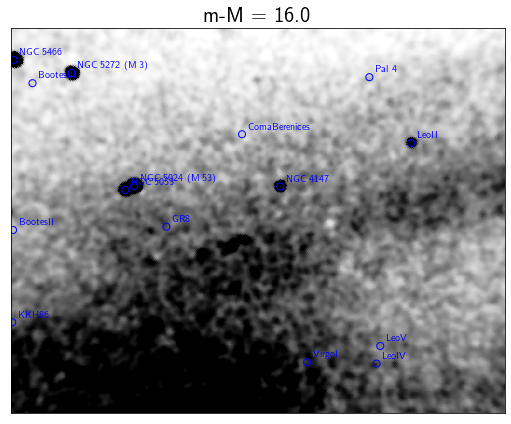

In [497]:
import plot_density_healpy
reload(plot_density_healpy)

stream = 'Lethe'
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

mu = 16.
# ax, proj = plot_density_healpy.plot_stream(hpxcube, modulus, stream=None, ends = [(145, 17), (160, 15)], mu_min=mu, mu_max=mu, save=False, plot_streams=False)
# plot_density_healpy.plot_stream(hpxcube, modulus, stream=None, ends = [(145, 17), (160, 15)], mu_min=15., mu_max=18.5, save=True, plot_streams=False, savedir='../plots/decals/zoom/')


ax, proj = plot_density_healpy.plot_stream(hpxcube, modulus, stream=None, ends = [(180, 15), (190, 15)], reso=3.0, smoothing=0.25, mu_min=mu, mu_max=mu, save=False, plot_streams=False, savedir='/Users/nora/projects/stream_search/plots/zoom/185-15/')
plot_density_healpy.plot_dwarfs_gcs(ax, proj, mu, 100)

# plot_density_healpy.plot_stream(hpxcube, modulus, stream=None, ends = [(180, 15), (190, 15)], reso=3.0, smoothing=0.25, mu_min=14.0, mu_max=19.0, save=True, plot_streams=False, savedir='/Users/nora/projects/stream_search/plots/zoom/185-15/')

# ax, proj = plot_density_healpy.plot_stream(hpxcube, modulus, stream=None, ends = [(180, 15), (190, 15)], mu_min=mu, mu_max=mu, save=False, plot_streams=False)
# plot_density_healpy.plot_stream(hpxcube, modulus, stream=None, ends = [(145, 17), (160, 15)], mu_min=15., mu_max=18.5, save=True, plot_streams=False, savedir='../plots/decals/zoom/')


In [441]:
mw_streams.keys()

dict_keys(['VOD/VSS', 'Monoceros', 'EBS', 'Her-Aq', 'PAndAS', 'Tri-And', 'Tri-And2', 'PiscesOv', 'EriPhe', 'Phoenix', 'WG1', 'WG2', 'WG3', 'WG4', 'Acheron', 'Cocytos', 'Lethe', 'Styx', 'ACS', 'Pal15', 'Eridanus', 'TucanaIII', 'Indus', 'Jhelum', 'Ravi', 'Chenab', 'Elqui', 'Aliqa_Uma', 'Turbio', 'Willka_Yaku', 'Turranburra', 'Wambelong', 'Palca', 'Jet', 'Gaia-1', 'Gaia-2', 'Gaia-3', 'Gaia-4', 'Gaia-5', 'PS1-A', 'PS1-B', 'PS1-C', 'PS1-D', 'PS1-E', 'ATLAS', 'Ophiucus', 'Sangarius', 'Scamander', 'Corvus', '20.0-1', 'Sgr-L10', 'Orphan', 'Pal5', 'GD-1', 'Tri/Pis', 'NGC5466', 'Alpheus', 'Hermus', 'Hyllus', 'Cetus', 'Kwando', 'Molonglo', 'Murrumbidgee', 'Orinoco', 'Phlegethon', 'Slidr', 'Sylgr', 'Ylgr', 'Fimbulthul', 'Svol', 'Fjorm', 'Gjoll', 'Leiptr'])

# Test Bkg Fitting

In [1168]:
reload(plot_density_healpy)
reload(plot_density)

# data = plot_density.prepare_hpxmap(16, hpxcube, fracdet, modulus, sgr=True, sigma=0.2)

hpxmap = hpxcube[:,np.argmin(np.abs(16-modulus))]
# data = plot_density.prepare_hpxmap(16, hpxcube, fracdet, modulus, fracmin=0.5, clip=100, sgr=True)
data = plot_density_healpy.prepare_data(16, hpxcube, modulus, fracdet, sigma=0.1, fracmin=0.5, clip=100, sgr=True)
bkg = plot_density_healpy.fit_bkg(data, proj, sigma=0.1)

KeyboardInterrupt: 

In [707]:
np.min(data), np.max(data)

(-0.032245116918246275, 13.020418547208799)

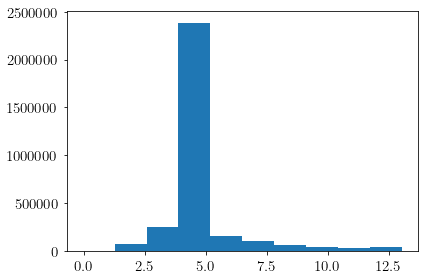

In [709]:
plt.hist(data)
plt.show()


0.00018352732844384434 4.577908506271969


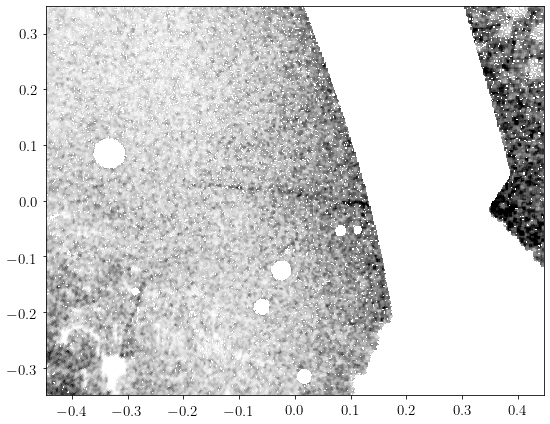

In [716]:
proj = hp.projector.GnomonicProj(xsize=1024, ysize=800, rot=[phi, theta, psi], reso=3.)
img = proj.projmap(data, func)

vmin, vmax = get_vscale(img, q=[0, 80])
print(vmin, vmax)
vmin, vmax = 1, 8

fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.imshow(img, origin='bottom', vmin=vmin, vmax=vmax, cmap='Greys', extent=proj.get_extent())


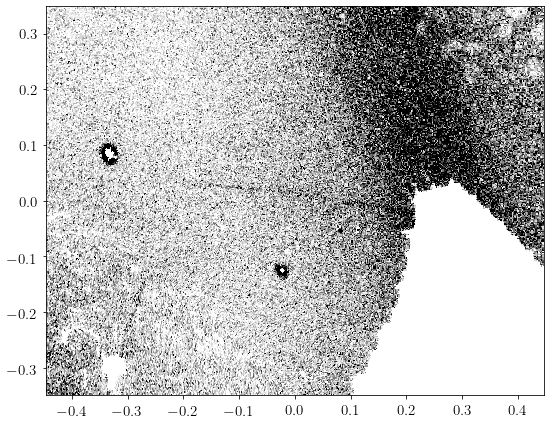

In [556]:
proj = hp.projector.GnomonicProj(xsize=1024, ysize=800, rot=[phi, theta, psi], reso=3.)
img = proj.projmap(hpxmap, func)

vmin, vmax = get_vscale(img, q=[1, 90])

fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.imshow(img, origin='bottom', vmin=vmin, vmax=vmax, cmap='Greys', extent=proj.get_extent())


In [558]:
# bkg = fit_bkg_poly(data, proj)

In [689]:
percent = [2,95]
deg = 5
sigma = 0.1

nside = hp.get_nside(data.mask)
lon, lat = hp.pix2ang(nside, np.arange(hp.nside2npix(nside)), lonlat=True)

vmin, vmax = np.percentile(data.compressed(), q=percent)
data = np.clip(data, vmin, vmax)
data.fill_value = np.ma.median(data)

data = np.ma.array(hp.smoothing(data, sigma=np.radians(sigma), verbose=False),
                   mask=data.mask)

sel = ~data.mask
x, y = proj.ang2xy(lon[sel], lat[sel], lonlat=True)
sel2 = ~np.isnan(x) & ~np.isnan(y)
v = data[sel][sel2]
x = x[sel2]
y = y[sel2]


In [690]:
c = polyfit2d(x, y, v, [deg, deg])

In [691]:
from numpy.polynomial import polynomial
# Evaluate the polynomial
x, y = proj.ang2xy(lon, lat, lonlat=True)
bkg2 = polynomial.polyval2d(x, y, c)
bkg2 = np.ma.array(bkg, mask=data.mask, fill_value=np.nan)


In [693]:
np.sum(bkg == bkg2)

551052

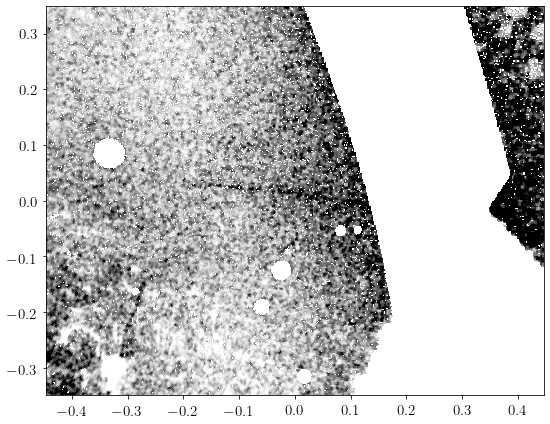

In [722]:
reload(plot_density_healpy)
plot_density_healpy.plot_proj(proj, data-bkg, vmin=-2, vmax=2)

In [760]:
99.99/60*5

8.3325

In [809]:
np.unique(fracdet)

array([0., 1.])

In [818]:
np.unique(data)

masked_array(data=[--, nan, nan, ..., nan, nan, --],
             mask=[ True, False, False, ..., False, False,  True],
       fill_value=-1.6375e+30)

In [821]:
hp.UNSEEN

-1.6375e+30

In [828]:
np.unique(data[~data.mask][~np.isnan(data[~data.mask])])

masked_array(data=[],
             mask=[],
       fill_value=-1.6375e+30,
            dtype=float64)

In [904]:
np.unique(fracdet)
ra, dec = hp.pix2ang(512, np.arange(len(fracdet)), lonlat=True)

In [912]:
np.sum(fracdet[(ra > 183) & (ra < 187) & (dec > 13) & (dec < 17)] == 0)

7

Using ends =  [[180, 15], [190, 15]]
185.0 15.054701128833468 0.00463736152005177


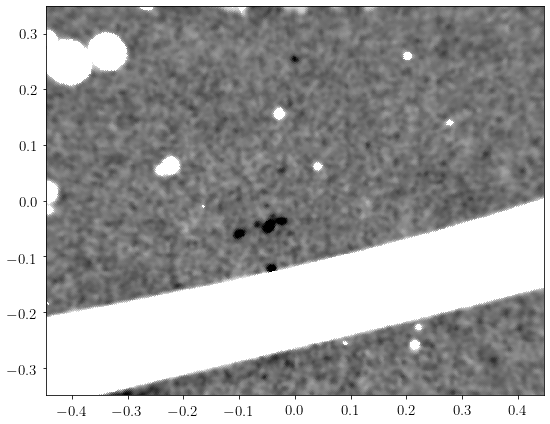

In [1137]:
reload(plot_density_healpy)
reload(streamlib)
proj = plot_density_healpy.get_gnomonic_proj(ends=[[180,15],[190,15]])

mu = 15
data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.2, fracmin=0.5, clip=100, sgr=True, globs_dwarfs=True)
bkg = plot_density_healpy.fit_bkg(data, proj, sigma=0.1)
# bkg.fill_value = np.nanmedian(bkg[~bkg.mask])
# print(data.fill_value, bkg.fill_value)
# sub = data - bkg
# sub.fill_value = np.nanmedian(sub[~sub.mask])

# plot_density_healpy.plot_proj(proj, sub.filled(), vmin=-5, vmax=3)
plot_density_healpy.plot_proj(proj, data-bkg, vmin=-5, vmax=3)
# plot_density_healpy.plot_proj(proj, data, vmin=0, vmax=10)


In [918]:
reload(plot_density_healpy)
reload(streamlib)
proj = plot_density_healpy.get_gnomonic_proj(ends=[[180,15],[190,15]])

mu = 15
data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.2, fracmin=0.5, clip=100, sgr=True, globs_dwarfs=True)
bkg = plot_density_healpy.fit_bkg(data, proj, sigma=0.1)
# bkg.fill_value = np.nanmedian(bkg[~bkg.mask])
# print(data.fill_value, bkg.fill_value)
# sub = data - bkg
# sub.fill_value = np.nanmedian(sub[~sub.mask])

# plot_density_healpy.plot_proj(proj, sub.filled(), vmin=-5, vmax=3)
plot_density_healpy.plot_proj(proj, data-bkg, vmin=-5, vmax=3)
# plot_density_healpy.plot_proj(proj, data, vmin=0, vmax=10)


Using ends =  [[180, 15], [190, 15]]
185.0 15.054701128833468 0.006065105998369708
[-3.15538891 -3.08538053 -3.11532489 ... -0.89694574 -0.88881422
 -0.89452325]


SystemExit: 

(-0.4463679561975498,
 0.4463679561975498,
 -0.34862951808586734,
 0.34862951808586734)

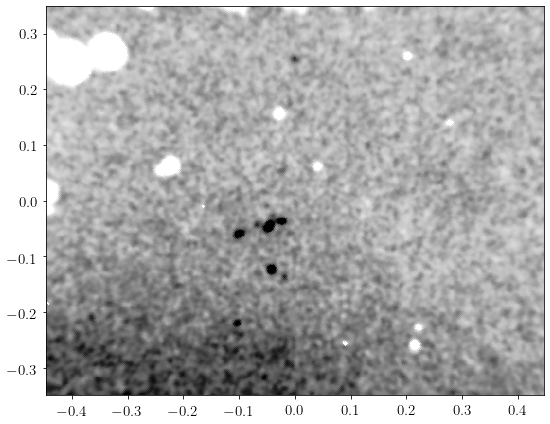

In [914]:
plot_density_healpy.plot_proj(proj, data-bkg, vmin=-2, vmax=5)

In [875]:
(hpxmap == hp.UNSEEN).size

3145728

In [872]:
data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.2, fracmin=0.5, clip=100, sgr=True, globs_dwarfs=False)
ax = plot_density_healpy.plot_proj(proj, data-bkg, vmin=-2, vmax=10)
plot_density_healpy.plot_dwarfs_gcs(ax, proj, 16, 100)

MaskError: Mask and data not compatible: data size is 3145728, mask size is 0.

In [1142]:
reload(plot_density_healpy)
reload(streamlib)
# proj = plot_density_healpy.get_gnomonic_proj(stream='ATLAS')
proj = plot_density_healpy.get_gnomonic_proj(ends=[[180,15],[190,15]])

for mu in np.arange(15, 19+0.05, 0.1):
# for mu in [18]:
    data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.1, fracmin=0.5, clip=100, sgr=True)
    bkg = plot_density_healpy.fit_bkg(data, proj, sigma=0.1)
    
#     plot_density_healpy.plot_proj(proj, data)
#     plt.savefig('../plots/zoom/ATLAS/mov5/ATLAS_%.1f.png' %mu)
    
#     plot_density_healpy.plot_proj(proj, data-bkg, vmin=-2, vmax=2)
#     plt.savefig('../plots/zoom/ATLAS/mov6/ATLAS_%.1f.png' %mu)
    
    data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.2, fracmin=0.5, clip=100, sgr=True, globs_dwarfs=True)
    plot_density_healpy.plot_proj(proj, data-bkg, vmin=-2, vmax=2)
#     plt.savefig('../plots/zoom/ATLAS/mov7/ATLAS_%.1f.png' %mu)
    plt.savefig('../plots/zoom/185-15/mov13/185-15_%.1f.png' %mu)
    plt.close('all')
    

Using ends =  [[180, 15], [190, 15]]
185.0 15.054701128833468 -0.002936998263972668


In [925]:
reload(plot_density_healpy)
proj = plot_density_healpy.get_gnomonic_proj(ends=[[180,15],[190,15]])

for mu in np.arange(15, 19+0.05, 0.1):
# for mu in [16]:
    data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.1, fracmin=0.5, clip=100, sgr=True)
    bkg = plot_density_healpy.fit_bkg(data, proj, sigma=0.1)
    
    plot_density_healpy.plot_proj(proj, data)
    plt.savefig('../plots/zoom/185-15/mov9/185-15_%.1f.png' %mu)
    
    plot_density_healpy.plot_proj(proj, data-bkg, vmin=-2, vmax=2)
    plt.savefig('../plots/zoom/185-15/mov10/185-15_%.1f.png' %mu)
    
    data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.2, fracmin=0.5, clip=100, sgr=True, globs_dwarfs=True)
    plot_density_healpy.plot_proj(proj, data-bkg, vmin=-2, vmax=2)
    plt.savefig('../plots/zoom/185-15/mov11/185-15_%.1f.png' %mu)
    plt.close('all')
    

Using ends =  [[180, 15], [190, 15]]
185.0 15.054701128833468 0.0014202694882015697


In [784]:
proj = plot_density_healpy.get_gnomonic_proj(ends=[[180,15],[190,15]])

datas = []
bkgs = []
for mu in np.arange(15, 18+0.05, 0.1):
    print(mu)
    data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.1, fracmin=0.5, clip=100, sgr=True)
    bkg = plot_density_healpy.fit_bkg(data, proj, sigma=0.1)
    datas.append(data)
    bkgs.append(bkg)


Using ends =  [[180, 15], [190, 15]]
185.0 15.054701128833468 0.009283944112618837
15.0
15.1
15.2
15.299999999999999
15.399999999999999
15.499999999999998
15.599999999999998
15.699999999999998
15.799999999999997
15.899999999999997
15.999999999999996
16.099999999999994
16.199999999999996
16.299999999999997
16.399999999999995
16.499999999999993
16.599999999999994
16.699999999999996
16.799999999999994
16.89999999999999
16.999999999999993
17.099999999999994
17.199999999999992
17.29999999999999
17.39999999999999
17.499999999999993
17.59999999999999
17.69999999999999
17.79999999999999
17.89999999999999
17.99999999999999


In [785]:
datas = np.asarray(datas)
bkgs = np.asarray(bkgs)

In [786]:
datas.shape, bkgs.shape

((31, 3145728), (31, 3145728))

In [788]:
slice1 = np.sum(datas[:10,:] - bkgs[:10,:], axis=0)
slice2 = np.sum(datas[10:20,:] - bkgs[10:20,:], axis=0)
slice3 = np.sum(datas[20:,:] - bkgs[20:,:], axis=0)

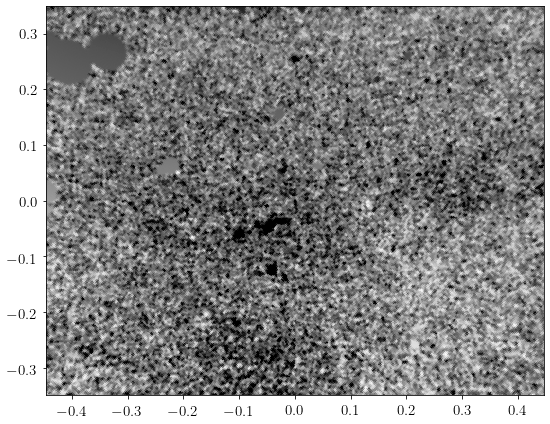

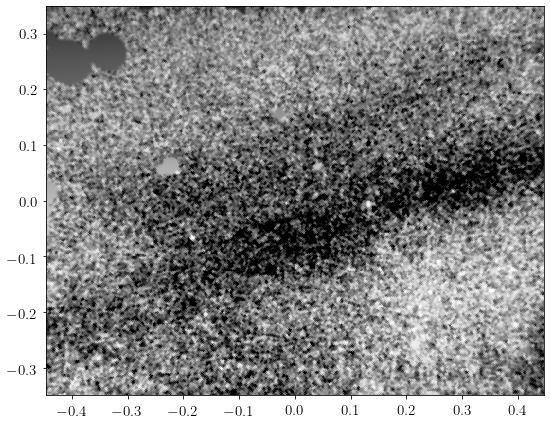

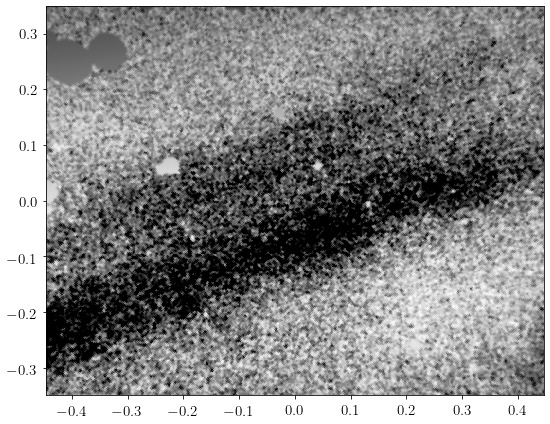

In [798]:
plot_density_healpy.plot_proj(proj, slice1, vmin=-30, vmax=20)
plot_density_healpy.plot_proj(proj, slice2, vmin=-30, vmax=20)
plot_density_healpy.plot_proj(proj, slice3, vmin=-30, vmax=20)

In [946]:
mu = 16.0
i = np.argmin(np.abs(mu - modulus))
hpxmap = np.copy(hpxcube[:, i])

print(np.sum(hpxmap == hp.UNSEEN))

fracdet = np.ones(hpxmap.size)
fracdet[hpxmap == 0] = 0

0


In [1119]:
hpxmap128 = fitsio.open('../data/DECaLS_nside128.fits.gz')[0].data

In [1120]:
frac128 = hpxmap128 > 0

In [1121]:
frac512 = load_data.convert_fracdet(frac128, 512)

185.0 15.054701128833468 -0.007413408081321502
20.0 15.054701128833468 -0.003833943069723003
16.0


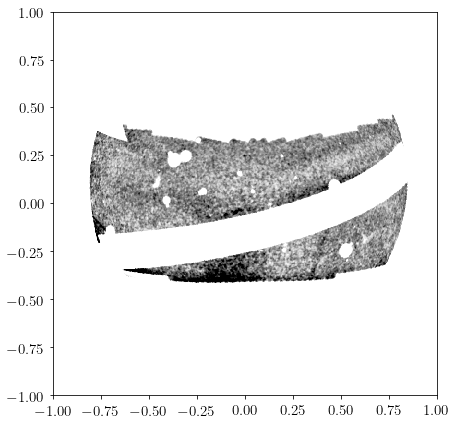

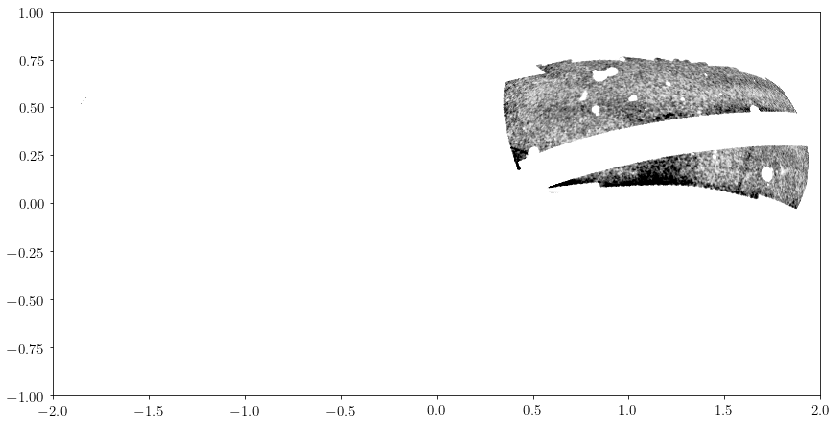

In [1170]:
reload(plot_density_healpy)
reload(streamlib)

# proj = plot_density_healpy.get_mollweide_proj(ends=[[180,15],[190,15]])
# proj = plot_density_healpy.get_mollweide_proj(ends=[[25,5],[35,15]])
# proj = plot_density_healpy.get_ortho_proj(ends=[[190,15],[200,15]], half_sky=False)
proj1 = plot_density_healpy.get_ortho_proj(ends=[[180,15],[190,15]], half_sky=True)
proj2 = plot_density_healpy.get_ortho_proj(ends=[[15,15],[25,15]], half_sky=False)


for mu in [16.0]:
# for mu in np.arange(15, 19.05, 0.1):
    print(mu)
    
    data = plot_density_healpy.prepare_data(mu, hpxcube, modulus, fracdet, sigma=0.2, fracmin=0.5, clip=100, sgr=True, globs_dwarfs=True)
    bkg = plot_density_healpy.fit_bkg(data, proj, sigma=0.2)

#     ax = plot_density_healpy.plot_proj(proj, data)
#     plt.savefig('../plots/healpy_ortho_data.png')
    
#     ax = plot_density_healpy.plot_proj(proj, bkg)
#     ax.set_title('m - M = %.1f' %mu)
#     plot_density_healpy.plot_stream_footprints(ax, proj, mu, dmu=0.5)
#     plt.savefig('../plots/ortho/full/mov1/ortho_full_bkg_labels_%.1f.png' %mu)
    
    ax = plot_density_healpy.plot_proj(proj1, data-bkg, vmin=-2, vmax=2)
    ax = plot_density_healpy.plot_proj(proj2, data-bkg, vmin=-2, vmax=2)
#     ax.set_title('m - M = %.1f' %mu)
#     plt.savefig('../plots/ortho/full/mov1/ortho_full_sub_%.1f.png' %mu)

#     ax = plot_density_healpy.plot_proj(proj, fracdet, vmin=-1, vmax=2)
#     plt.savefig('../plots/healpy_ortho_fracdet.png')
    
#     plt.close('all')

In [1274]:
reload(plot_density)
plot_density.plot_pretty(fontsize=20, tex=False)

13.0 13.047961797466591 -0.006592440644278051
29.999999999999993 -40.10759784832556 0.0055886170327939765
185.0 10.037423045910714 -0.006901321075446997
17.0


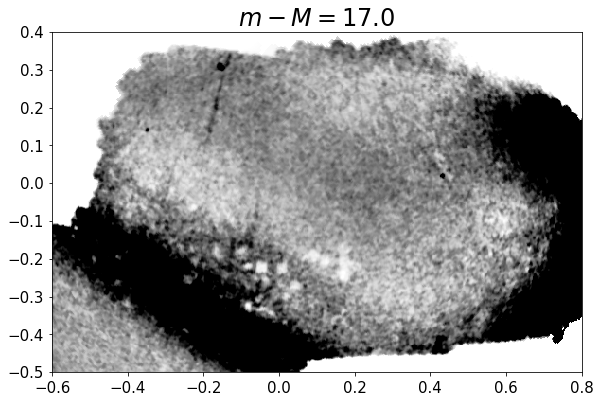

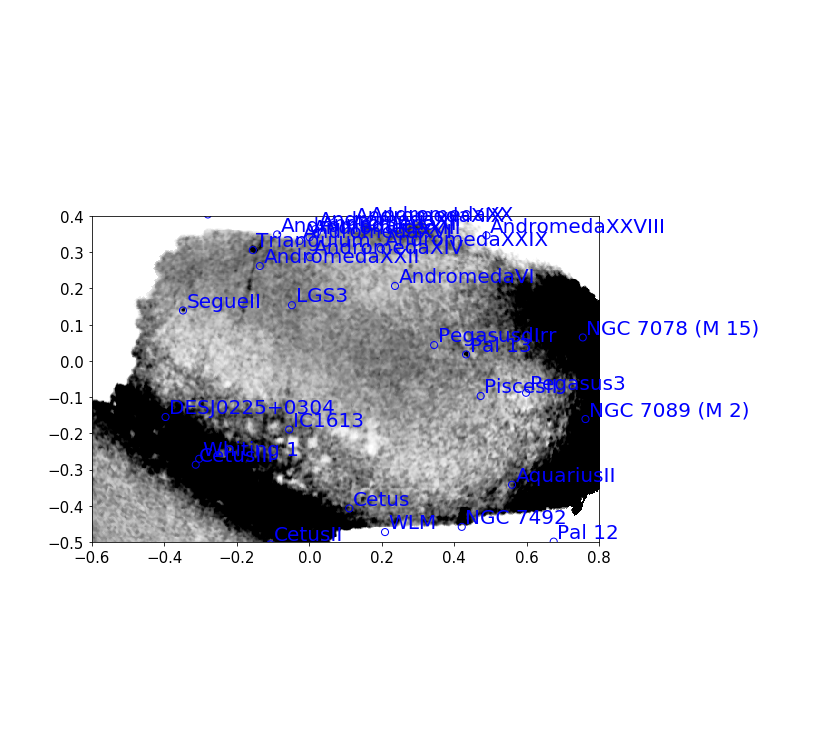

In [1275]:
import plot_density_healpy
reload(plot_density_healpy)
import load_data
reload(load_data)
import streamlib
reload(streamlib)
import healpy as hp
from matplotlib.path import Path


# hpxcube_south, fracdet_south, modulus = load_data.load_data('DECaLS', 0.0001, 13.5, 23.0)
# hpxcube_north, fracdet_north, modulus = load_data.load_data('BASS', 0.0001, 13.5, 23.0)

# proj = plot_density_healpy.get_ortho_proj(ends=[[180,10],[190,10]], half_sky=True)
# proj = plot_density_healpy.get_mollweide_proj(ends=[[180,15],[190,15]])
# proj = plot_density_healpy.get_mollweide_proj(ends=[[185,60],[195,60]])
# proj = plot_density_healpy.get_gnomonic_proj(ends=[[8,13],[18,13]], reso=3.0, xsize=1400, ysize=1000)

# proj = plot_density_healpy.get_ortho_proj(ends=[[20,-30],[30,-30]], half_sky=False)

proj1 = plot_density_healpy.get_ortho_proj(ends=[[8,13],[18,13]], half_sky=True)
# xmin, xmax, ymin, ymax = -0.6, 0.6, -0.5, 0.4

proj2 = plot_density_healpy.get_ortho_proj(ends=[[25,-40],[35,-40]], half_sky=True)
# xmin, xmax, ymin, ymax = -0.8, 0.8, -0.5, 0.6

proj3 = plot_density_healpy.get_ortho_proj(ends=[[180,10],[190,10]], half_sky=True)
# xmin, xmax, ymin, ymax = -0.9, 0.9, -0.4, 0.5

for mu in [17.0]:
# for mu in np.arange(15, 19.05, 0.1):
    print(mu)
    
    # data_north = plot_density_healpy.prepare_data(mu, hpxcube_north, modulus, fracdet_north, sigma=0.2, fracmin=0.5, clip=100, sgr=True, acs=False, globs_dwarfs=True)
    
#     data_south = plot_density_healpy.prepare_data(mu, hpxcube_south, modulus, fracdet_south, sigma=0.2, fracmin=0.5, clip=100, sgr=True, acs=False, globs_dwarfs=True)
#     data_south_unm = plot_density_healpy.prepare_data(mu, hpxcube_south, modulus, fracdet_south, sigma=0.2, fracmin=0.5, clip=100, lmc=False, milky_way=False, sgr=False, globulars=False, dwarfs=False, galaxies=False, plane=False, center=False, globs_dwarfs=False, acs=False)
#     bkg1 = plot_density_healpy.fit_bkg(data_south, proj1, sigma=0.1)
#     bkg2 = plot_density_healpy.fit_bkg(data_south, proj2, sigma=0.1)
#     bkg3 = plot_density_healpy.fit_bkg(data_south, proj3, sigma=0.1)
#     bkg1.mask = data_south_unm.mask
#     bkg2.mask = data_south_unm.mask
#     bkg3.mask = data_south_unm.mask
    
    ax1 = plot_density_healpy.plot_proj(proj1, data_south_unm-bkg1, vmin=-2, vmax=2)
    ax1.set_title(r'$m - M = %.1f$' %mu)
    xmin, xmax, ymin, ymax = -0.6, 0.8, -0.5, 0.4
    ax1.set_xlim(xmin, xmax)
    ax1.set_ylim(ymin, ymax)

    ax1 = plot_density_healpy.plot_proj(proj1, data_south_unm-bkg1, vmin=-2, vmax=2)
    plot_density_healpy.plot_dwarfs_gcs(ax1, proj1, mu, 100)
#     ax1.set_title(r'$m - M = %.1f$' %mu)
    xmin, xmax, ymin, ymax = -0.6, 0.8, -0.5, 0.4
    ax1.set_xlim(xmin, xmax)
    ax1.set_ylim(ymin, ymax)
    
#     plt.savefig('../plots/zoom/13-13/mov3/13-13_%.1f.png' %mu)
#     plt.close('all')
    
#     ax2 = plot_density_healpy.plot_proj(proj2, data_south_unm-bkg2, vmin=-2, vmax=2)
#     ax2.set_title(r'$m - M = %.1f$' %mu)
#     xmin, xmax, ymin, ymax = -0.8, 0.8, -0.5, 0.6
#     ax2.set_xlim(xmin, xmax)
#     ax2.set_ylim(ymin, ymax)    
#     plt.savefig('../plots/zoom/30-n40/mov3/30-n40_%.1f.png' %mu)
#     plt.close('all')
    
#     ax3 = plot_density_healpy.plot_proj(proj3, data_south_unm-bkg3, vmin=-2, vmax=2)
#     ax3.set_title(r'$m - M = %.1f$' %mu)
#     xmin, xmax, ymin, ymax = -1.0, 1.0, -0.35, 0.5
#     ax3.set_xlim(xmin, xmax)
#     ax3.set_ylim(ymin, ymax)  
#     plt.savefig('../plots/zoom/185-10/mov3/185-10_%.1f.png' %mu)
#     plt.close('all')

In [1244]:
reload(streamlib)

<module 'streamlib' from '/Users/nora/projects/stream_search/code/streamlib.py'>

In [942]:
pix = hp.ang2pix(512, 185, 80, lonlat=True)
hpxmap[pix]

0.0

In [1060]:
img = proj.projmap(data, func)
img2 = proj2.projmap(data, func)

TypeError: cannot unpack non-iterable NoneType object

In [1106]:
def convert_fracdet(fracdet, nside):
    nside1 = nside
    fracdet2 = fracdet
    nside2 = hp.npix2nside(len(fracdet2))
    
    pix1 = np.arange(hp.nside2npix(nside1))
    ra1, dec1 = hp.pix2ang(nside1, pix1, lonlat=True)
    pix12 = hp.ang2pix(nside2, ra1, dec1, lonlat=True)
    
    fracdet1 = np.zeros(hp.nside2npix(nside1))
    fracdet1 = fracdet2[pix12]
    
    return fracdet1

In [1111]:
frac11 = convert_fracdet(frac2, 512)

import load_data
reload(load_data)
frac111 = load_data.convert_fracdet(frac2, 512)

In [1061]:
nside1 = 512
nside2 = 128

In [1083]:
pix1 = np.arange(hp.nside2npix(nside1))
ra1, dec1 = hp.pix2ang(nside1, pix1, lonlat=True)

pix2 = np.arange(hp.nside2npix(nside2))
ra2, dec2 = hp.pix2ang(nside2, pix2, lonlat=True)

In [1084]:
pix12 = hp.ang2pix(nside2, ra1, dec1, lonlat=True)
pix21 = hp.ang2pix(nside1, ra2, dec2, lonlat=True)

In [1086]:
pix12.shape, pix21.shape, np.unique(pix12).shape, np.unique(pix21).shape

((3145728,), (196608,), (196608,), (196608,))

In [1097]:
hpxmap2 = np.zeros(hp.nside2npix(nside2))
# idx2 = np.random.randint(low=0, high=len(hpxmap2), size=int(hp.nside2npix(nside2)/5))
idx2 = (dec2 > 3.0) & (ra2 < 120)
hpxmap2[idx2] = 1.0

In [1098]:
frac2 = hpxmap2 == 1.0

In [1099]:
frac1 = np.zeros(hp.nside2npix(nside1))
frac1 = frac2[pix12]